<a href="https://colab.research.google.com/github/melindasiburian/3rdsemester_project/blob/main/Data_Mining_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Global surface temperature_DM project dataset.csv')
df.head()

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
0,1880,-0.19,-0.25,-0.09,-.17,-.10,-.21,-.19,-.11,-.15,-.24,-.22,-.18,-.17,***,***,-.12,-.17,-.20
1,1881,-0.20,-0.14,0.03,.05,.06,-.19,.00,-.04,-.16,-.22,-.19,-.07,-.09,-.10,-.17,.04,-.08,-.19
2,1882,0.16,0.13,0.04,-.16,-.14,-.23,-.17,-.08,-.15,-.24,-.17,-.37,-.11,-.09,.07,-.09,-.16,-.19
3,1883,-0.29,-0.37,-0.12,-.19,-.18,-.07,-.08,-.14,-.22,-.12,-.24,-.11,-.18,-.20,-.34,-.16,-.10,-.20
4,1884,-0.13,-0.08,-0.36,-.40,-.34,-.35,-.31,-.28,-.27,-.25,-.34,-.31,-.29,-.27,-.11,-.37,-.31,-.29


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146 entries, 0 to 145
Data columns (total 19 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Year    146 non-null    int64  
 1   Jan     146 non-null    float64
 2   Feb     146 non-null    float64
 3   Mar     146 non-null    float64
 4   Apr     146 non-null    object 
 5   May     146 non-null    object 
 6   Jun     146 non-null    object 
 7   Jul     146 non-null    object 
 8   Aug     146 non-null    object 
 9   Sep     146 non-null    object 
 10  Oct     146 non-null    object 
 11  Nov     146 non-null    object 
 12  Dec     146 non-null    object 
 13  J-D     146 non-null    object 
 14  D-N     146 non-null    object 
 15  DJF     146 non-null    object 
 16  MAM     146 non-null    object 
 17  JJA     146 non-null    object 
 18  SON     146 non-null    object 
dtypes: float64(3), int64(1), object(15)
memory usage: 21.8+ KB


In [ ]:
# Check for duplicated rows
dupes = df.duplicated()
dupes.sum()

0

In [ ]:
bulan_cols = ['Apr', 'May', 'Jun', 'Jul','Aug','Sep','Oct','Nov','Dec','J-D','D-N','DJF','MAM','JJA','SON']
# Ganti nilai '***' menjadi NaN
df[bulan_cols] = df[bulan_cols].replace(['***'], np.nan)
# Konversi semua ke float (jika masih object)
df[bulan_cols] = df[bulan_cols].apply(pd.to_numeric, errors='coerce')

In [ ]:
(df.dtypes)

,0
Year,int64
Jan,float64
Feb,float64
Mar,float64
Apr,float64
May,float64
Jun,float64
Jul,float64
Aug,float64
Sep,float64


In [ ]:
df

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
0,1880,-0.19,-0.25,-0.09,-0.17,-0.10,-0.21,-0.19,-0.11,-0.15,-0.24,-0.22,-0.18,-0.17,NaN,NaN,-0.12,-0.17,-0.20
1,1881,-0.20,-0.14,0.03,0.05,0.06,-0.19,0.00,-0.04,-0.16,-0.22,-0.19,-0.07,-0.09,-0.10,-0.17,0.04,-0.08,-0.19
2,1882,0.16,0.13,0.04,-0.16,-0.14,-0.23,-0.17,-0.08,-0.15,-0.24,-0.17,-0.37,-0.11,-0.09,0.07,-0.09,-0.16,-0.19
3,1883,-0.29,-0.37,-0.12,-0.19,-0.18,-0.07,-0.08,-0.14,-0.22,-0.12,-0.24,-0.11,-0.18,-0.20,-0.34,-0.16,-0.10,-0.20
4,1884,-0.13,-0.08,-0.36,-0.40,-0.34,-0.35,-0.31,-0.28,-0.27,-0.25,-0.34,-0.31,-0.29,-0.27,-0.11,-0.37,-0.31,-0.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141,2021,0.82,0.64,0.89,0.76,0.80,0.85,0.92,0.81,0.92,0.99,0.92,0.88,0.85,0.84,0.75,0.82,0.86,0.94
142,2022,0.91,0.89,1.05,0.83,0.84,0.93,0.94,0.95,0.89,0.97,0.73,0.80,0.89,0.90,0.89,0.91,0.94,0.86
143,2023,0.88,0.97,1.23,0.99,0.94,1.09,1.19,1.19,1.48,1.34,1.42,1.37,1.17,1.13,0.88,1.06,1.16,1.41
144,2024,1.26,1.45,1.39,1.32,1.16,1.24,1.20,1.30,1.23,1.34,1.29,1.27,1.29,1.30,1.36,1.29,1.25,1.29


Check and Handle Missing values

In [ ]:
df.isnull().sum()

,0
Year,0
Jan,0
Feb,0
Mar,0
Apr,1
May,1
Jun,1
Jul,1
Aug,1
Sep,1


In [ ]:
# Handle missing data points with Linear Interpolation
for column in df.columns:
    if df[column].isnull().any():
        df[column] = df[column].interpolate(method='linear')
print(df.isnull().sum())

Year    0
Jan     0
Feb     0
Mar     0
Apr     0
May     0
Jun     0
Jul     0
Aug     0
Sep     0
Oct     0
Nov     0
Dec     0
J-D     0
D-N     1
DJF     1
MAM     0
JJA     0
SON     0
dtype: int64


In [ ]:
# Handle missing data points for first rows
# Filling NaN values in the first row with the mean of the 2nd and 3rd rows

if df.iloc[0].isnull().any():
    mean_val = df.iloc[1:3].mean()
    df.iloc[0] = df.iloc[0].fillna(mean_val)

print(df.isnull().sum())

Year    0
Jan     0
Feb     0
Mar     0
Apr     0
May     0
Jun     0
Jul     0
Aug     0
Sep     0
Oct     0
Nov     0
Dec     0
J-D     0
D-N     0
DJF     0
MAM     0
JJA     0
SON     0
dtype: int64


In [ ]:
# Summary Stats
df.describe()

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
count,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000
mean,1952.500000,0.077808,0.086027,0.103836,0.076507,0.065753,0.054247,0.077534,0.076781,0.081233,0.107260,0.099932,0.074384,0.081712,0.081678,0.077055,0.082123,0.069863,0.096096
std,42.290661,0.447766,0.452429,0.459046,0.422441,0.399712,0.401791,0.382203,0.400606,0.400260,0.407723,0.414560,0.430395,0.405570,0.404911,0.429587,0.422931,0.391494,0.402376
min,1880.000000,-0.810000,-0.640000,-0.640000,-0.600000,-0.560000,-0.530000,-0.520000,-0.550000,-0.590000,-0.590000,-0.580000,-0.820000,-0.500000,-0.500000,-0.680000,-0.580000,-0.500000,-0.520000
25%,1916.250000,-0.247500,-0.240000,-0.230000,-0.250000,-0.240000,-0.247500,-0.190000,-0.217500,-0.200000,-0.197500,-0.180000,-0.220000,-0.200000,-0.217500,-0.237500,-0.257500,-0.225000,-0.190000
50%,1952.500000,-0.010000,-0.035000,0.015000,-0.015000,-0.035000,-0.050000,-0.030000,-0.040000,-0.055000,0.010000,0.020000,-0.040000,-0.030000,-0.045000,-0.030000,-0.015000,-0.040000,-0.015000
75%,1988.750000,0.320000,0.397500,0.345000,0.297500,0.280000,0.267500,0.290000,0.297500,0.272500,0.267500,0.287500,0.357500,0.317500,0.297500,0.357500,0.310000,0.310000,0.280000
max,2025.000000,1.370000,1.450000,1.390000,1.320000,1.160000,1.240000,1.200000,1.300000,1.480000,1.340000,1.420000,1.370000,1.290000,1.300000,1.360000,1.290000,1.250000,1.410000


Visual Exploration

In [ ]:
import plotly.graph_objects as go
# Mapping of columns to season names for the legend
season_info = {
    'J-D': 'All Year Around',
    'DJF': 'Dec-Jan-Feb (Northern Hem\'s meteorological Winter)',
    'MAM': 'Mar-Apr-May (Northern Hem\'s meteorological Spring)',
    'JJA': 'Jun-Jul-Aug (Northern Hem\'s meteorological Summer)',
    'SON': 'Sep-Oct-Nov (Northern Hem\'s meteorological Fall)'
}

# Inisialisasi figure
fig = go.Figure()

# Tambahkan garis untuk setiap musim
for col, title in season_info.items():
    fig.add_trace(go.Scatter(
        x=df['Year'],
        y=df[col],
        mode='lines+markers',
        name=title
    ))

# Tambahkan layout
fig.update_layout(
    title='Temperature Anomalies by Season (Interactive)',
    xaxis=dict(
        title='Year',
        tickmode='linear',
        dtick=20,               # Setiap 5 tahun
        range=[df['Year'].min(), df['Year'].max()]
    ),
    yaxis=dict(
        title='Temperature Anomaly (°C)',
        tickmode='linear',
        dtick=0.25,             # Setiap 0.2 °C
        range=[df[season_info.keys()].min().min() - 0.1, df[season_info.keys()].max().max() + 0.1]
    ),
    legend_title='Season',
    template='plotly_white',
    hovermode='x unified'
)

# Tampilkan grafik
fig.show()

1. Pola Tren Jangka Panjang (Long-Term Trend) Garis-garis untuk semua musim (DJF - musim dingin, MAM - musim semi, JJA - musim panas, SON - musim gugur) serta rata-rata tahunan (J-D) menunjukkan tren kenaikan yang konsisten dari waktu ke waktu. Ini mengindikasikan adanya pemanasan global yang terus berlangsung.

2. Keseragaman Antar Musim Walaupun tiap musim memiliki fluktuasi masing-masing, semua garis menunjukkan arah tren yang hampir paralel, yang berarti semua musim mengalami peningkatan suhu secara seragam. Ini sejalan dengan hasil analisis Mann-Kendall sebelumnya bahwa keempat musim menunjukkan tren naik yang signifikan.

3. Fluktuasi Musiman dan Anomali Terdapat fluktuasi jangka pendek (tahun-ke-tahun) yang terlihat dalam bentuk “zig-zag” pada grafik. Fluktuasi ini wajar terjadi karena pengaruh fenomena alam jangka pendek (misalnya El Niño, letusan gunung berapi, atau aktivitas matahari), namun tidak menutupi tren kenaikan jangka panjang.

4. Kenaikan Signifikan Setelah 1980 Titik balik yang signifikan terlihat setelah tahun 1980, di mana suhu mulai meningkat dengan lebih cepat. Ini sesuai dengan hasil analisis change point detection yang mengidentifikasi 1980 sebagai salah satu titik perubahan utama.

Finding & Visualizing Outliers

IQR Method

In [ ]:
Q1 = df['J-D'].quantile(0.25)
Q3 = df['J-D'].quantile(0.75)
IQR = Q3 - Q1

# Define bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Find outliers
outliers = df[(df['J-D'] < lower_bound) | (df['J-D'] > upper_bound)]
print("Outliers:\n", outliers)

Outliers:
      Year   Jan   Feb   Mar   Apr   May   Jun   Jul   Aug   Sep   Oct   Nov  \
143  2023  0.88  0.97  1.23  0.99  0.94  1.09  1.19  1.19  1.48  1.34  1.42   
144  2024  1.26  1.45  1.39  1.32  1.16  1.24  1.20  1.30  1.23  1.34  1.29   
145  2025  1.37  1.26  1.36  1.32  1.16  1.24  1.20  1.30  1.23  1.34  1.29   

      Dec   J-D   D-N   DJF   MAM   JJA   SON  
143  1.37  1.17  1.13  0.88  1.06  1.16  1.41  
144  1.27  1.29  1.30  1.36  1.29  1.25  1.29  
145  1.27  1.29  1.30  1.30  1.29  1.25  1.29  


Z-Score Method

In [ ]:
!pip install numpy==1.26.4



In [ ]:
from scipy.stats import zscore

z_score = zscore(df['SON'])
print(z_score)
threshold = 3 # 3 SDs away from the mean

ol = df[abs(z_score) > threshold]
print(ol)

[-0.73840115 -0.71346325 -0.71346325 -0.73840115 -0.96284231 -0.86309069
 -0.9129665  -0.96284231 -0.31445675 -0.9379044  -1.11246975 -0.81321487
 -0.83815278 -0.73840115 -0.88802859 -0.58877372 -0.31445675 -0.58877372
 -1.03765603 -0.23964303 -0.28951884 -0.81321487 -1.03765603 -1.41172462
 -1.18728347 -0.68852534 -0.96284231 -1.11246975 -1.36184881 -1.18728347
 -1.38678672 -0.98778022 -1.53641415 -0.98778022 -0.56383581 -0.73840115
 -1.21222137 -1.08753184 -0.5388979  -0.98778022 -0.88802859 -0.56383581
 -0.9379044  -0.63864953 -0.98778022 -0.51396    -0.51396    -0.41420837
 -0.66358744 -0.68852534 -0.33939465 -0.31445675 -0.63864953 -0.9379044
 -0.38927047 -0.68852534 -0.33939465 -0.04013978 -0.06507769 -0.28951884
  0.10948766  0.25911509 -0.18976722  0.15936347  0.30899091  0.13442556
 -0.41420837 -0.26458094 -0.51396    -0.48902209 -0.78827697 -0.13989141
 -0.28951884 -0.16482931 -0.26458094 -0.58877372 -0.71346325 -0.09001559
 -0.21470512 -0.41420837 -0.23964303 -0.13989141 -0.

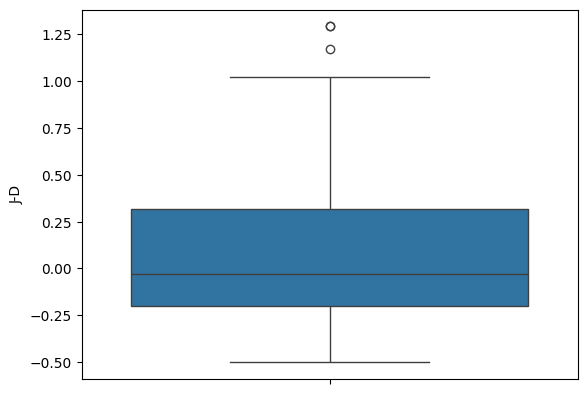

In [ ]:
sns.boxplot(y=df['J-D'], color=sns.color_palette()[0])

plt.show()

1. Suhu Global Didominasi oleh Nilai Netral hingga Sedikit Positif Sebagian besar data berada di antara sekitar -0.2°C hingga +0.3°C, menunjukkan bahwa fluktuasi suhu global relatif moderat dalam kurun waktu panjang.
Median di Sekitar Nol Median anomali suhu mendekati 0°C, menandakan bahwa selama lebih dari satu abad, setengah dari tahun-tahun dalam dataset mengalami suhu global yang hanya sedikit berbeda dari rerata 1951–1980.

2. Adanya Outlier Positif Terdapat titik-titik outlier di atas batas atas boxplot (sekitar +1.1 hingga +1.3°C), yang mengindikasikan beberapa tahun terakhir mengalami suhu global yang sangat tinggi dibandingkan tahun-tahun sebelumnya. Ini mendukung bukti pemanasan global yang makin ekstrem.

3. Distribusi Tidak Simetris (Positively Skewed) Distribusi cenderung miring ke kanan, yang berarti lebih banyak kejadian suhu ekstrem tinggi dibandingkan suhu ekstrem rendah di era modern.

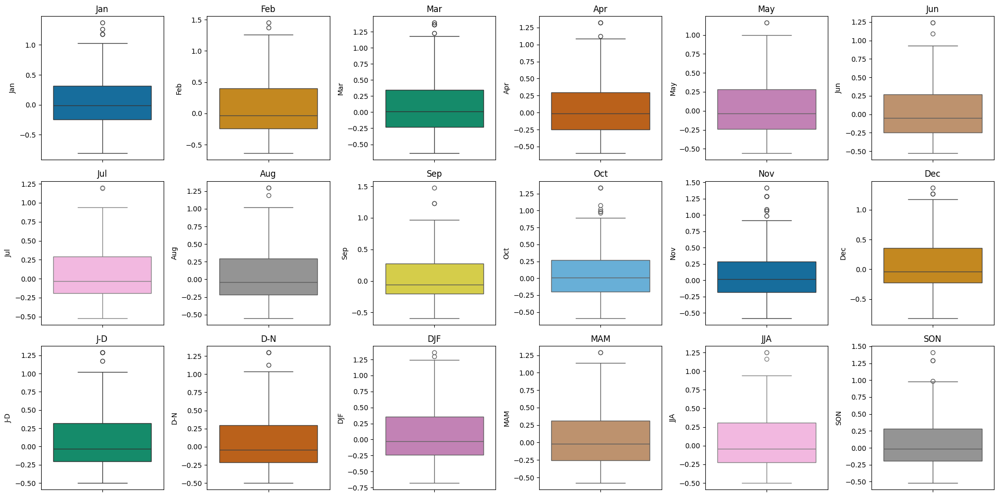

In [ ]:
# Set the color palette to 'colorblind'
palette = sns.color_palette("colorblind")

plt.figure(figsize=(20,10))

# Loop through each column (excluding 'Year')
for i, column in enumerate(df.columns.drop('Year')):
    # Create a subplot for each column
    plt.subplot(3, 6, i+1)
    # Use modulo to cycle through the colorblind-friendly palette
    color = palette[i % len(palette)]
    sns.boxplot(y=df[column], color=color)
    plt.title(column)
    plt.tight_layout()

plt.show()

1. Sebaran Suhu Relatif Konsisten di Semua Bulan Hampir semua boxplot bulanan memiliki rentang interkuartil (IQR) yang mirip: dari sekitar -0.4°C hingga +0.4°C. Ini menandakan bahwa anomali suhu tidak terlalu dipengaruhi oleh bulan tertentu secara drastis, meskipun ada fluktuasi minor.

2. Adanya Outlier Positif di Hampir Semua Bulan dan Musim Setiap bulan dan musim menampilkan outlier di atas batas atas, menandakan tahun-tahun dengan suhu jauh lebih tinggi dari biasanya. Terutama terlihat di Feb, Mar, Apr, May, Oct, dan DJF memperkuat bukti pemanasan ekstrem pada musim dingin dan transisi.

3. Tidak Ada Musim yang Bebas dari Pemanasan Musim DJF, MAM, JJA, dan SON semua menunjukkan peningkatan suhu dengan outlier.Hal ini menunjukkan bahwa pemanasan global bersifat lintas-musim, tidak hanya terjadi di musim panas saja.

4. Distribusi Positively Skewed (Miring ke Kanan) Hampir semua boxplot memiliki median yang cenderung lebih dekat ke batas bawah IQR. Ini mengindikasikan bahwa kasus suhu ekstrem tinggi lebih sering terjadi dibandingkan suhu ekstrem rendah.

Correlation Heatmap

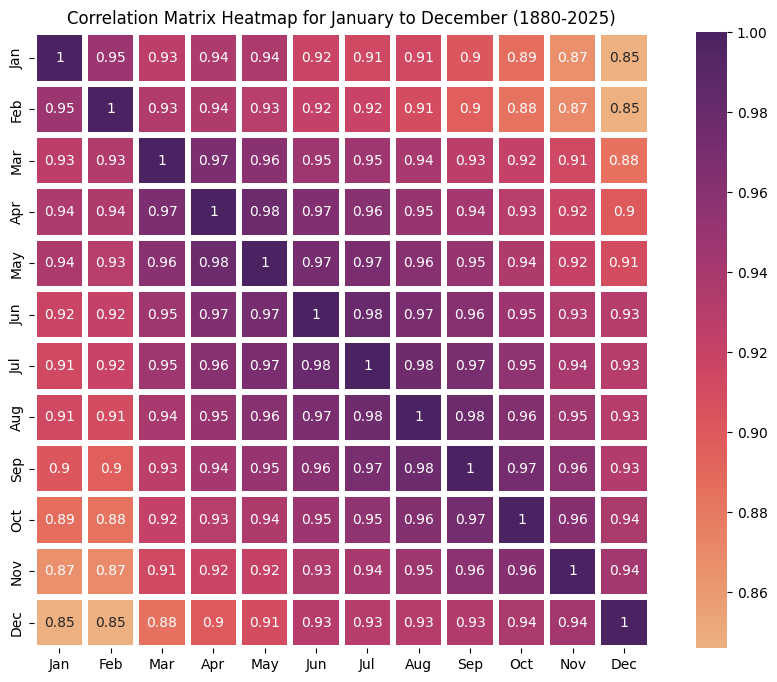

In [ ]:
months_columns = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
df_months = df[months_columns]

corr_matrix = df_months.corr()

plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix,
            annot = True,
            cmap='flare',
            linewidth=3,
            square=True)
plt.title('Correlation Matrix Heatmap for January to December (1880-2025)')
plt.show()

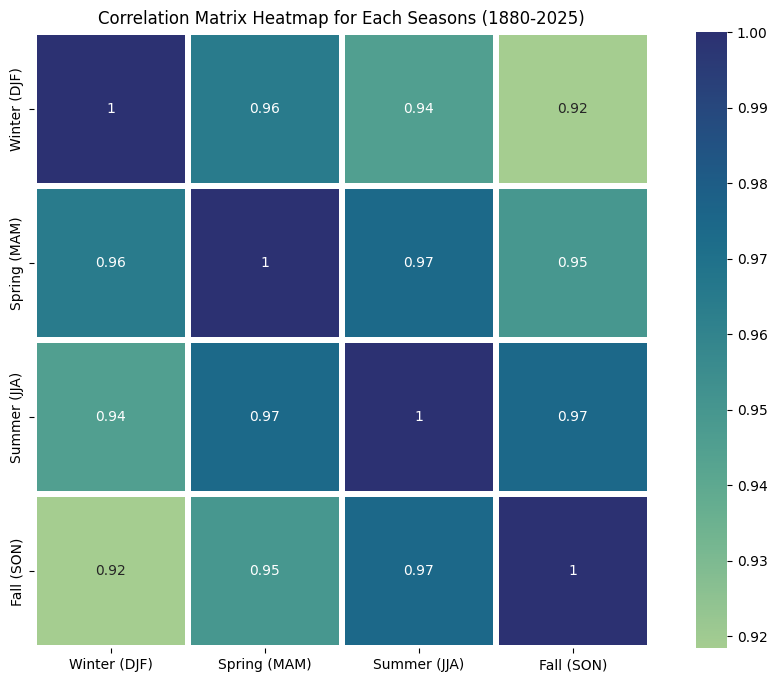

In [ ]:
season_columns = ['DJF', 'MAM', 'JJA', 'SON'] # winter, spring, summer, fall
df_seasons = df[season_columns]

corr_matrix_seasons = df_seasons.corr()
season_labels = ['Winter (DJF)', 'Spring (MAM)', 'Summer (JJA)', 'Fall (SON)']

plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix_seasons,
            annot = True,
            cmap='crest',
            linewidth=3,
            xticklabels=season_labels,
            yticklabels=season_labels,
            square=True)
plt.title('Correlation Matrix Heatmap for Each Seasons (1880-2025)')
plt.show()

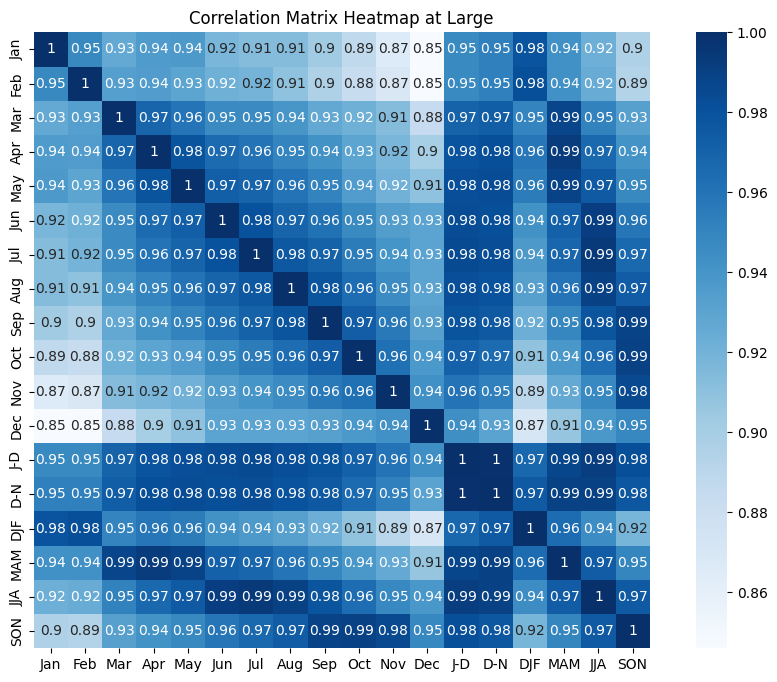

In [ ]:
new_df = df.drop(columns=['Year'])
corr_matrix2 = new_df.corr()

plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix2,
            annot = True,
            cmap='Blues',
            square=True)
plt.title('Correlation Matrix Heatmap at Large')
plt.show()

OBSERVATION FROM HEATMAPS

Analisis Korelasi Antara Variabel Bulanan dan Musiman

Korelasi yang tinggi antar bulan : Heatmap korelasi suhu bulanan (1880–2025) menunjukkan hubungan kuat antar bulan, terutama antara bulan-bulan berurutan seperti April–Mei dan Mei–Juni. Meskipun korelasi terendah terjadi antara bulan yang berjauhan seperti Januari–Desember (0.85), secara keseluruhan pola suhu menunjukkan konsistensi tren pemanasan global sepanjang tahun.

Seosanal Correlation : Heatmap korelasi musiman suhu global (1880–2025) menunjukkan hubungan yang sangat kuat antar musim, dengan nilai korelasi 0.92–0.97. Korelasi tertinggi terjadi antara musim semi dan musim panas (0.97), menandakan tren pemanasan yang konsisten. Meskipun musim dingin dan gugur memiliki korelasi paling rendah (0.92), nilainya tetap tinggi, menunjukkan bahwa perubahan suhu global berdampak merata sepanjang tahun tanpa terikat musim tertentu.

**Trend Analysis**

Rate of Change


Trend Analysis for J-D:
Slope: 0.008382886834469264
Intercept: -16.285874215534115


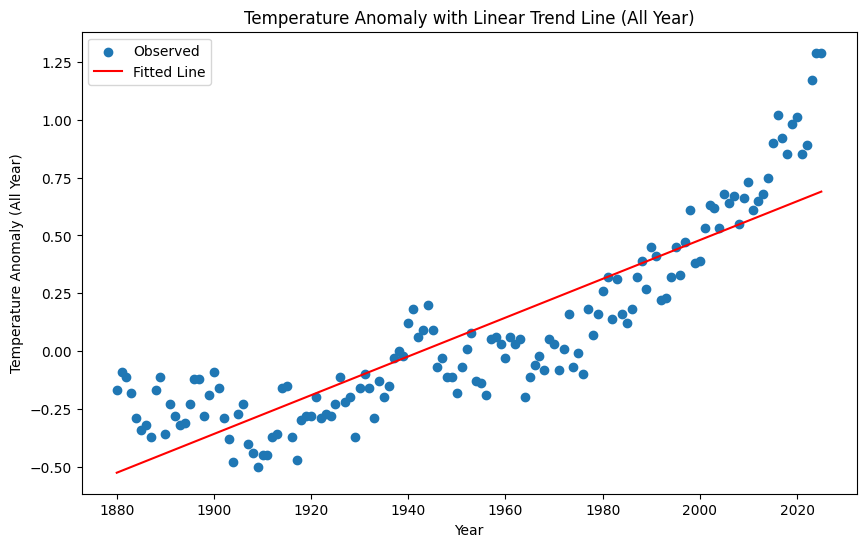


Trend Analysis for DJF:
Slope: 0.008599404239730848
Intercept: -16.71328198355393


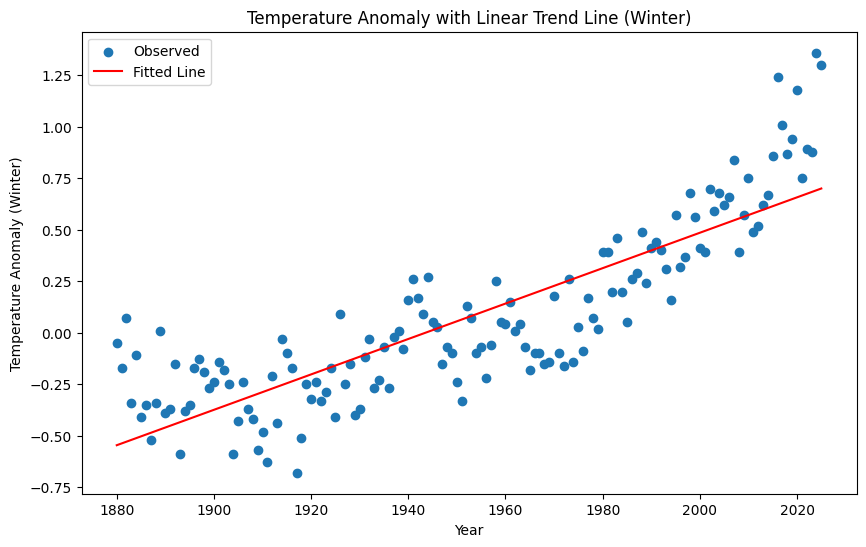


Trend Analysis for MAM:
Slope: 0.008620728215707633
Intercept: -16.74984855349792


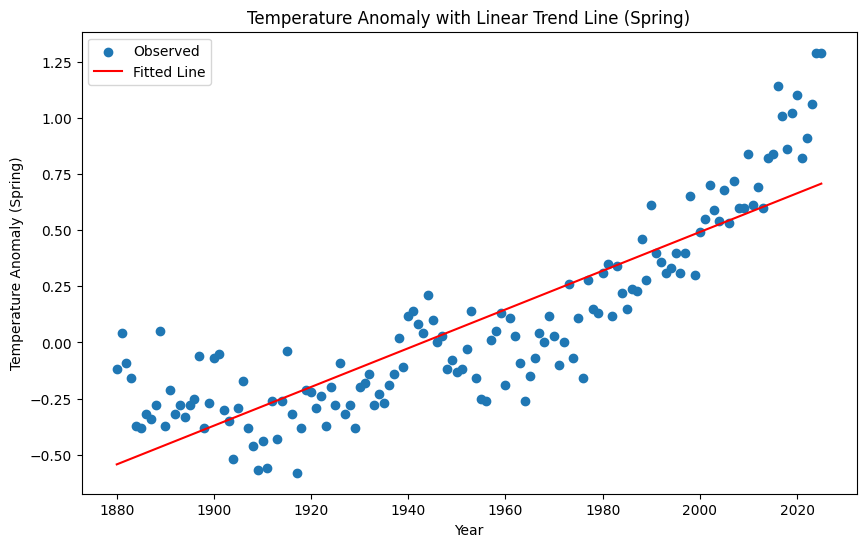


Trend Analysis for JJA:
Slope: 0.00803516720812085
Intercept: -15.61880096015733


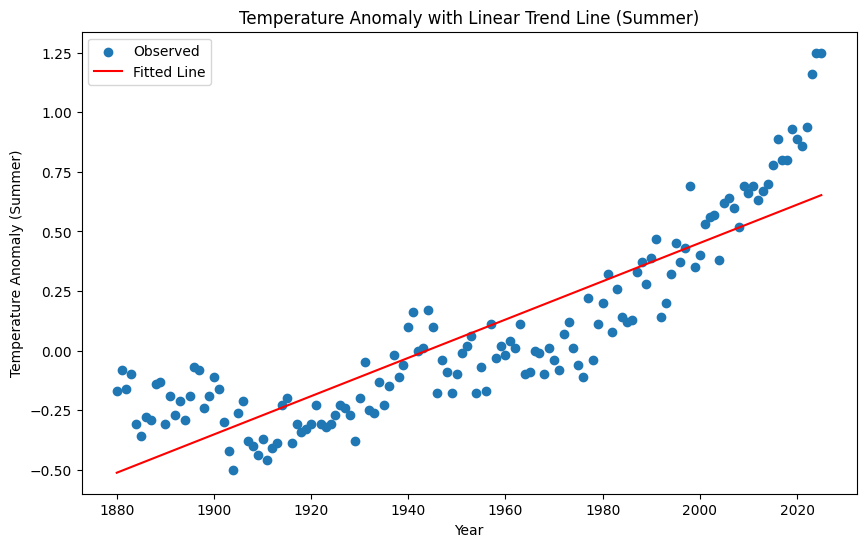


Trend Analysis for SON:
Slope: 0.008110957940096208
Intercept: -15.740549487626886


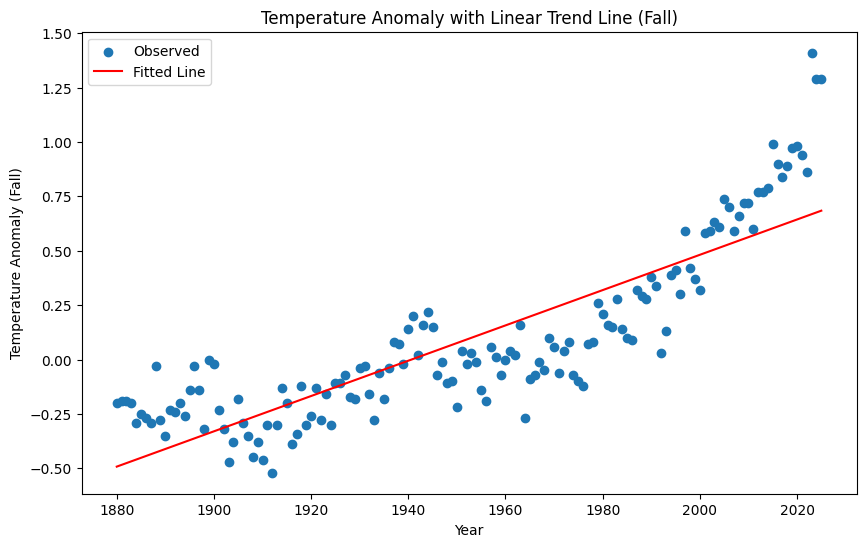

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np

# Mapping of columns to season names
season_names = {
    'J-D': 'All Year',
    'DJF': 'Winter',
    'MAM': 'Spring',
    'JJA': 'Summer',
    'SON': 'Fall'
}

X = df['Year'].values.reshape(-1, 1)
for col, season in season_names.items():
    y = df[col]

    model = LinearRegression().fit(X, y)
    print(f"\nTrend Analysis for {col}:")
    print(f"Slope: {model.coef_[0]}")
    print(f"Intercept: {model.intercept_}")

    y_pred = model.predict(X)

    plt.figure(figsize=(10, 6))
    plt.scatter(df['Year'], y, label='Observed')
    plt.plot(df['Year'], y_pred, color='red', label='Fitted Line')
    plt.xlabel('Year')
    plt.ylabel(f'Temperature Anomaly ({season})')
    plt.title(f'Temperature Anomaly with Linear Trend Line ({season})')
    plt.legend()
    plt.show()

Berdasarkan hasil visualisasi regresi linier terhadap data anomali suhu permukaan global dari tahun 1880 hingga 2025, ditemukan adanya tren peningkatan suhu yang signifikan di semua musim, baik tahunan maupun musiman. Garis regresi yang ditampilkan pada masing-masing grafik memperlihatkan kemiringan (slope) yang positif, mengindikasikan bahwa anomali suhu mengalami kenaikan secara konsisten setiap tahun.

Secara numerik, slope tertinggi tercatat pada musim semi (MAM) sebesar 0.0086°C, diikuti oleh musim dingin (DJF) sebesar 0.0085°C, rata-rata tahunan (J-D) sebesar 0.0083°C, musim gugur (SON) sebesar  0.0081°C dan musim panas (JJA) sebesar 0.0080°C. Hal ini menunjukkan bahwa setiap musim mengalami pemanasan, dengan laju yang relatif seragam, meskipun sedikit lebih tinggi pada musim gugur.

Temuan ini memperkuat indikasi bahwa pemanasan global tidak hanya terjadi secara tahunan, tetapi juga merata sepanjang musim dalam setahun. Kenaikan linier dalam anomali suhu dari waktu ke waktu mendukung bukti empiris terhadap perubahan iklim yang sedang berlangsung. Jika tren ini berlanjut, maka dampaknya terhadap lingkungan, ekosistem, dan kehidupan manusia dapat menjadi lebih signifikan dalam dekade-dekade mendatang.

Moving Average Method

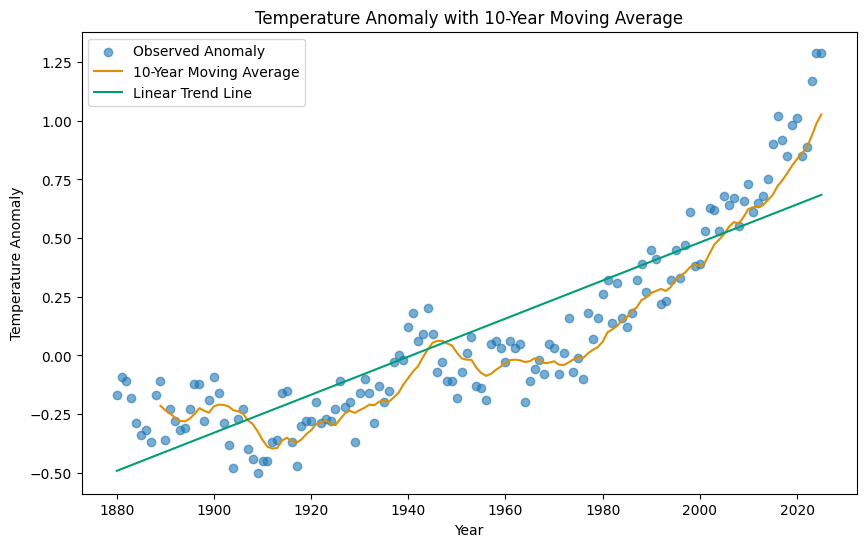

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

palette = sns.color_palette("colorblind", 3)
window_size = 3 # try different size of window
df['Moving_Avg'] = df['J-D'].rolling(window=window_size).mean()

plt.figure(figsize=(10,6))
plt.scatter(df['Year'], df['J-D'], alpha=0.6, label='Observed Anomaly')
plt.plot(df['Year'], df['Moving_Avg'], color=palette[1], label=f'{window_size}-Year Moving Average')
plt.plot(df['Year'], y_pred, color=palette[2], label='Linear Trend Line')
plt.xlabel('Year')
plt.ylabel('Temperature Anomaly')
plt.title(f'Temperature Anomaly with {window_size}-Year Moving Average')
plt.legend()
plt.show()

Metode moving average digunakan dalam analisis deret waktu untuk menghaluskan fluktuasi jangka pendek dan menyoroti tren jangka panjang dalam data. Pada studi ini, diterapkan rata-rata bergerak selama 3 tahun terhadap anomali suhu global sepanjang tahun (kolom J-D) untuk mengidentifikasi pola perubahan suhu yang lebih jelas dari waktu ke waktu.

Visualisasi hasil menunjukkan bahwa garis 3-Year Moving Average (garis oranye) mengikuti pola umum dari data asli yang tersebar (titik biru), namun dengan tingkat fluktuasi yang lebih halus. Hal ini membantu mengurangi dampak dari variabilitas tahun-ke-tahun yang dapat disebabkan oleh faktor sementara seperti fenomena El Niño, letusan gunung berapi, atau variabel iklim jangka pendek lainnya.

Garis tren linier (garis hijau) juga ditambahkan untuk memberikan estimasi laju peningkatan jangka panjang suhu anomali secara keseluruhan. Dapat diamati bahwa baik rata-rata bergerak maupun tren linier sama-sama menunjukkan tren peningkatan suhu yang konsisten dan signifikan sejak awal abad ke-20 hingga tahun 2023, memperkuat bukti adanya pemanasan global.

Penggunaan moving average sangat bermanfaat dalam menyederhanakan visualisasi pola data dan mendukung interpretasi tren jangka panjang dalam konteks perubahan iklim global.

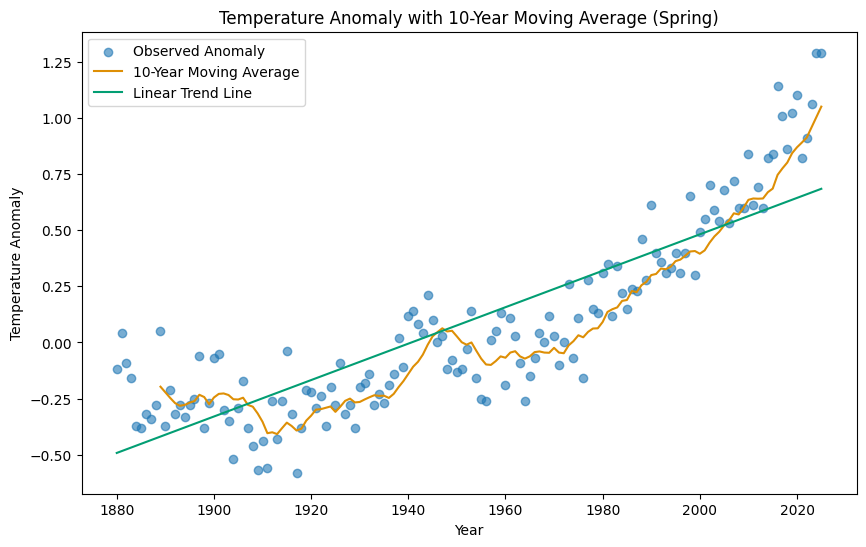

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

palette = sns.color_palette("colorblind", 3)
window_size = 3 # try different size of window
df['Moving_Avg_S'] = df['MAM'].rolling(window=window_size).mean()

plt.figure(figsize=(10,6))
plt.scatter(df['Year'], df['MAM'], alpha=0.6, label='Observed Anomaly')
plt.plot(df['Year'], df['Moving_Avg_S'], color=palette[1], label=f'{window_size}-Year Moving Average')
plt.plot(df['Year'], y_pred, color=palette[2], label='Linear Trend Line')
plt.xlabel('Year')
plt.ylabel('Temperature Anomaly')
plt.title(f'Temperature Anomaly with {window_size}-Year Moving Average (Spring)')
plt.legend()
plt.show()

Moving Average Method (Spring)

Pada visualisasi ini, digunakan 3-Year Moving Average terhadap anomali suhu musim semi (MAM – Maret, April, Mei) untuk periode 1880 hingga 2023. Pendekatan ini memungkinkan identifikasi tren iklim musiman tanpa terdistorsi oleh variabilitas tahunan ekstrem.

Dari grafik terlihat bahwa kurva rata-rata bergerak (garis oranye) berhasil menangkap pola umum pergerakan suhu anomali musiman secara lebih halus dibandingkan data aktual (titik biru). Sementara itu, garis tren linier (garis hijau) menunjukkan adanya kecenderungan kenaikan suhu yang konsisten selama lebih dari satu abad, yang menegaskan adanya tren pemanasan yang signifikan selama musim semi.

Penggunaan moving average jangka pendek seperti 3 tahun menjaga sensitivitas terhadap perubahan iklim musiman yang cepat, sembari tetap menyaring noise acak dari tahun ke tahun. Hasil ini mendukung bukti ilmiah terkait perubahan iklim global, khususnya pada musim semi di belahan bumi utara, yang mengalami peningkatan suhu rata-rata secara signifikan.

**Statistical Analysis**

ANOVA

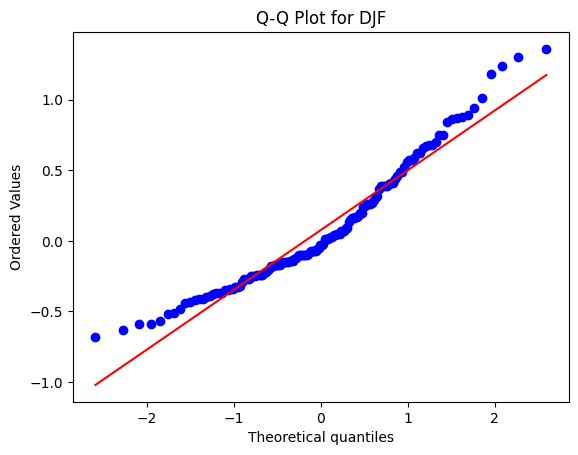

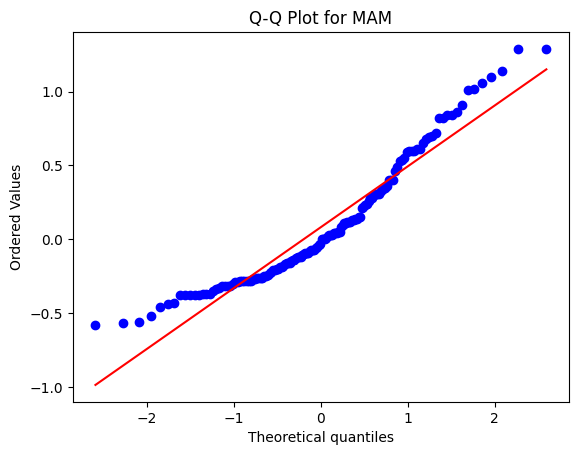

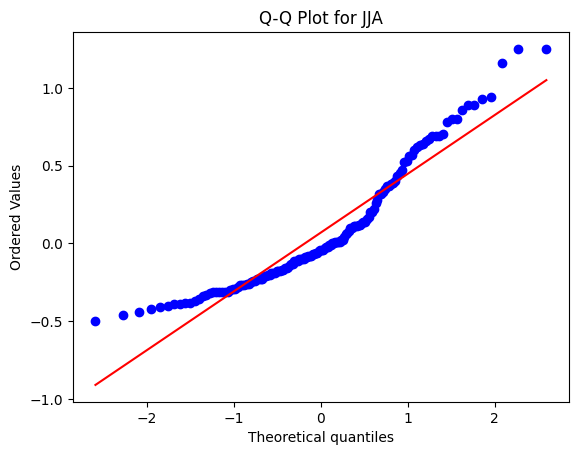

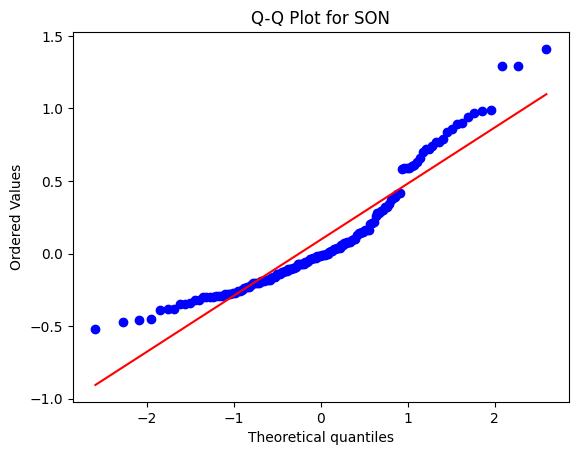

In [ ]:
## Q-Q Plot

import scipy.stats as stats
import matplotlib.pyplot as plt

seasons = ['DJF', 'MAM', 'JJA', 'SON']

for season in seasons:
    plt.figure()
    stats.probplot(df[season], dist="norm", plot=plt)
    plt.title(f'Q-Q Plot for {season}')
    plt.show()

Uji Normalitas Menggunakan Q-Q Plot Sebelum melakukan analisis varians (ANOVA), salah satu asumsi penting yang harus dipenuhi adalah bahwa data residual pada masing-masing kelompok bersifat normal. Oleh karena itu, dilakukan uji visual terhadap distribusi data menggunakan Quantile-Quantile (Q-Q) Plot untuk masing-masing musim: DJF (Winter), MAM (Spring), JJA (Summer), dan SON (Fall).

Pada grafik Q-Q plot, data dikatakan mendekati distribusi normal jika titik-titik data terletak di sepanjang garis diagonal merah. Namun, dari hasil visualisasi pada keempat musim, tampak bahwa titik-titik tidak mengikuti garis secara sempurna, terutama di bagian ekor distribusi (nilai ekstrem). Hal ini menunjukkan penyimpangan dari distribusi normal.

Penyimpangan yang paling jelas terlihat pada musim SON dan JJA, di mana deviasi dari garis referensi semakin mencolok pada kuartil atas dan bawah. Kondisi ini menunjukkan adanya skewness dan kurtosis yang mengindikasikan bahwa data tidak sepenuhnya memenuhi asumsi normalitas.

Karena pelanggaran terhadap asumsi normalitas ini, terutama pada ukuran sampel yang relatif kecil, penggunaan metode parametrik seperti One-Way ANOVA menjadi kurang tepat. Oleh karena itu, sebagai alternatif yang lebih sesuai, digunakan metode non-parametrik seperti Kruskal-Wallis H-Test, yang tidak mengasumsikan distribusi tertentu dari data residual.

In [ ]:
from scipy.stats import shapiro

for season in seasons:
    stat, p = shapiro(df[season])
    print(f'{season}: Statistics={stat}, p={p}')
    if p > 0.05:
        print('Sample looks Gaussian (fail to reject H0)')
    else:
        print('Sample does not look Gaussian (reject H0)')

DJF: Statistics=0.947104009744371, p=2.4377735853253115e-05
Sample does not look Gaussian (reject H0)
MAM: Statistics=0.9257799140923532, p=6.885329977274498e-07
Sample does not look Gaussian (reject H0)
JJA: Statistics=0.906866393106193, p=4.591529299103891e-08
Sample does not look Gaussian (reject H0)
SON: Statistics=0.8990084111131649, p=1.6421259326908814e-08
Sample does not look Gaussian (reject H0)


Uji Normalitas Menggunakan Shapiro-Wilk Untuk mengevaluasi apakah distribusi data musiman mengikuti distribusi normal, dilakukan uji Shapiro-Wilk terhadap empat kelompok musim, yaitu DJF (Winter), MAM (Spring), JJA (Summer), dan SON (Fall). Uji ini digunakan secara luas untuk mendeteksi normalitas, khususnya pada ukuran sampel kecil hingga sedang, dengan hipotesis nol (H₀) bahwa data berasal dari distribusi normal.

Karena seluruh p-value berada jauh di bawah ambang signifikansi 0.05, maka hipotesis nol (H₀) ditolak untuk keempat musim. Artinya, data anomali suhu musiman tidak mengikuti distribusi normal.

Temuan ini diperkuat oleh hasil visualisasi Q-Q Plot sebelumnya yang juga menunjukkan deviasi dari garis normal teoretis. Dengan demikian, penggunaan metode parametrik seperti One-Way ANOVA menjadi kurang tepat dalam kasus ini, dan pendekatan non-parametrik seperti Kruskal-Wallis H-Test lebih sesuai karena tidak mensyaratkan asumsi distribusi normal.

The Kruskal-Willis Test

Hipotesis nol (H₀): Tidak ada perbedaan signifikan dalam distribusi nilai (median atau peringkat) anomali suhu di antara keempat musim (DJF, MAM, JJA, SON).

Hipotesis alternatif (H₁): Terdapat paling tidak satu musim yang memiliki distribusi anomali suhu yang berbeda secara signifikan dari yang lain, yang menunjukkan bahwa tidak semua kelompok musim berasal dari populasi dengan distribusi yang sama.

Uji Kruskal-Wallis digunakan sebagai alternatif dari One-Way ANOVA ketika asumsi normalitas tidak terpenuhi. Uji ini mengandalkan peringkat data daripada nilai aslinya, sehingga lebih robust terhadap outlier dan distribusi yang tidak normal.

In [ ]:
from scipy import stats
import pandas as pd

season_data = df[['DJF', 'MAM', 'JJA', 'SON']].stack()

# Creating a new data structure
season_df = pd.DataFrame({'Season': season_data.index.get_level_values(1), 'Anomaly': season_data.values})
print(season_df)

# Kruskal-Wallis test
h_stat, p_value = stats.kruskal(season_df[season_df['Season'] == 'DJF']['Anomaly'],
                                season_df[season_df['Season'] == 'MAM']['Anomaly'],
                                season_df[season_df['Season'] == 'JJA']['Anomaly'],
                                season_df[season_df['Season'] == 'SON']['Anomaly'])
print("Kruskal-Wallis Test Results: H-Stat =", h_stat, ", P-value =", p_value)

    Season  Anomaly
0      DJF    -0.05
1      MAM    -0.12
2      JJA    -0.17
3      SON    -0.20
4      DJF    -0.17
..     ...      ...
579    SON     1.29
580    DJF     1.30
581    MAM     1.29
582    JJA     1.25
583    SON     1.29

[584 rows x 2 columns]
Kruskal-Wallis Test Results: H-Stat = 0.565415687036246 , P-value = 0.9043019640973643


H-statistik mengukur seberapa besar perbedaan peringkat antar kelompok (musim) dibandingkan dengan yang diharapkan jika semua kelompok berasal dari distribusi yang sama. Nilai H-statistik yang rendah, seperti yang diperoleh (H = 0.565), menunjukkan bahwa tidak terdapat deviasi substansial dari hipotesis nol, artinya tidak ada perbedaan distribusi yang mencolok antar musim.

P-value sebesar 0.904 mengindikasikan bahwa probabilitas mendapatkan hasil seperti ini (atau yang lebih ekstrem) jika hipotesis nol benar sangat tinggi, jauh di atas ambang batas signifikansi umum (α = 0.05). Dengan demikian, kita tidak memiliki cukup bukti untuk menolak hipotesis nol.

Interpretation

Nilai p-value yang sangat tinggi (di atas 0.05) menunjukkan bahwa tidak ada cukup bukti untuk menolak Hipotesis Nol (H₀). Ini berarti tidak ada perbedaan yang signifikan secara statistik dalam rata-rata anomali suhu antar musim (DJF, MAM, JJA, SON). Jadi, variasi yang muncul dalam data bisa jadi hanya karena faktor kebetulan atau fluktuasi alami, bukan karena perbedaan mendasar antar musim.

Time Series Decomposition

Time Series Decomposition involves seperating a time series into several components (Trend, Seasonal, and Residual).

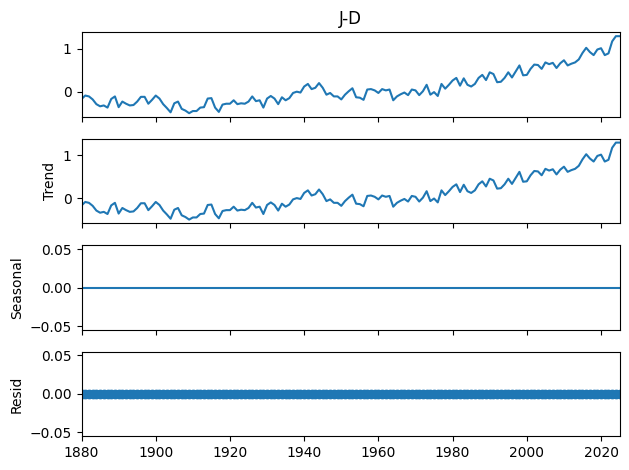

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Convert year to datetime format to prepare for seasonal_decompose
df['Year'] = pd.to_datetime(df['Year'], format='%Y')
df.set_index('Year', inplace=True)

result = seasonal_decompose(df['J-D'], model='additive')

result.plot()
plt.show()

Trend Component: Grafik komponen tren menunjukkan kenaikan jangka panjang dalam anomali suhu global, meskipun dengan fluktuasi. Ini adalah indikasi kuat adanya tren pemanasan global dari waktu ke waktu.

Seasonal Component: Komponen musiman (seasonal) berupa garis datar di sekitar nol menunjukkan bahwa tidak ada pola musiman yang signifikan dalam data ini. Dengan kata lain, data ini tidak menunjukkan variasi tetap yang berulang berdasarkan musim.

Residual Component: Komponen residual yang berkisar dekat angka nol dan terlihat sebagai garis padat menunjukkan bahwa fluktuasi acak masih ada, tetapi sebagian besar variasi dalam data sudah dijelaskan oleh komponen tren. Sisanya merupakan noise atau variabilitas tak terjelaskan, kemungkinan disebabkan oleh fenomena iklim yang tak terdeteksi oleh model.

Mann-Kendall Trend Test

Mann-Kendall Trend Test is a non-parametric test used to identify and confirm trends in time series data. It can help confirm whether the trend is statistically significant, without any assumptions of specific distribution of the data.

Null Hypothesis (H0): There is no trend in the temperature anomalies over time for the given season.

Alternative Hypothesis (H1): There is a trend in the temp anomalies over time for the given season.

In [ ]:
!pip install pymannkendall

M-K Trend Test for All-Year

In [ ]:
import pymannkendall as mk

result = mk.original_test(df['J-D'])

print(f"Trend: {result.trend}")
print(f"P-value: {result.p}")
print(f"Z-value: {result.z}")
print(f"Slope (Sen's slope): {result.slope}")

Trend: increasing
P-value: 0.0
Z-value: 13.056344928576511
Slope (Sen's slope): 0.008157894736842107


Uji Tren Mann-Kendall untuk Data Tahunan (J-D) Hasil uji Mann-Kendall menunjukkan adanya tren peningkatan signifikan dalam data anomali suhu tahunan global. Nilai Z = 13.056 menunjukkan tren positif yang sangat kuat, sedangkan p-value = 0.0 mengindikasikan bahwa tren tersebut sangat signifikan secara statistik.

Kemiringan Sen (Sen's Slope) sebesar +0.0082°C/tahun berarti bahwa anomali suhu global mengalami peningkatan rata-rata sebesar 0.008 derajat Celcius setiap tahun.

Dengan demikian, uji ini memberikan bukti kuat atas keberadaan tren pemanasan global jangka panjang.

M-K Trend Test for Seasonal

Different seasons might be differently affected by climate change.

In [ ]:
seasons = ['DJF','MAM','JJA','SON']

mk_results = {}
for season in seasons:
    result = mk.original_test(df[season])
    #print(result)
    mk_results[season] = {
        'Trend': result.trend,
        'P-value': result.p,
        'Z-value': result.z,
        'Slope': result.slope
    }
    print(mk_results[season])

for season, results in mk_results.items():
    print(f"Season: {season}, Results: {results}")

{'Trend': 'increasing', 'P-value': 0.0, 'Z-value': 11.971188402839505, 'Slope': 0.008478260869565218}
{'Trend': 'increasing', 'P-value': 0.0, 'Z-value': 12.570315505466938, 'Slope': 0.008571428571428572}
{'Trend': 'increasing', 'P-value': 0.0, 'Z-value': 12.828984519250282, 'Slope': 0.007903225806451612}
{'Trend': 'increasing', 'P-value': 0.0, 'Z-value': 12.698626342731743, 'Slope': 0.007613636363636363}
Season: DJF, Results: {'Trend': 'increasing', 'P-value': 0.0, 'Z-value': 11.971188402839505, 'Slope': 0.008478260869565218}
Season: MAM, Results: {'Trend': 'increasing', 'P-value': 0.0, 'Z-value': 12.570315505466938, 'Slope': 0.008571428571428572}
Season: JJA, Results: {'Trend': 'increasing', 'P-value': 0.0, 'Z-value': 12.828984519250282, 'Slope': 0.007903225806451612}
Season: SON, Results: {'Trend': 'increasing', 'P-value': 0.0, 'Z-value': 12.698626342731743, 'Slope': 0.007613636363636363}


Interpretation:

Interpretasi Hasil Uji Tren Mann-Kendall Musiman: Uji tren Mann-Kendall yang dilakukan pada data anomali suhu musiman (DJF, MAM, JJA, SON) menunjukkan bahwa semua musim mengalami tren peningkatan yang signifikan secara statistik, dengan p-value = 0.0 dan nilai Z berkisar antara 11.97 hingga 12.83.

Estimasi Kemiringan Sen (Sen’s Slope) untuk setiap musim berkisar antara +0.0076°C hingga +0.0086°C per tahun, menunjukkan bahwa laju peningkatan suhu berlangsung secara relatif seragam sepanjang tahun.

Hasil ini memperkuat bukti bahwa pemanasan global tidak hanya terjadi pada musim tertentu, melainkan berdampak pada seluruh musim dengan tren yang konsisten. Konsistensi ini memperlihatkan kekuatan dan cakupan luas sinyal pemanasan dalam sistem iklim.

Change Point Analysis

To identify points in time where the statistical properties of a time series change

In [ ]:
!pip install ruptures

Change Point Detection for All-Year

In [ ]:
import pandas as pd
import numpy as np

# 1. Baca ulang dataset
df = pd.read_csv('/content/drive/MyDrive/Global surface temperature_DM project dataset.csv')

# 2. Ganti semua '***' dan nilai kosong menjadi NaN
df.replace(['***'], np.nan, inplace=True)

# 3. Konversi kolom Apr, May, Jun, Jul menjadi float
for col in ['Apr', 'May', 'Jun', 'Jul','Aug','Sep','Oct','Nov','Dec','J-D','D-N','DJF','MAM','JJA','SON']:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# 4. Interpolasi nilai NaN di seluruh kolom secara linear
for column in df.columns:
    if df[column].isnull().any():
        df[column] = df[column].interpolate(method='linear')

# 5. Isi NaN di baris pertama (jika masih ada) dengan rata-rata baris 1 dan 2
if df.iloc[0].isnull().any():
    mean_val = df.iloc[1:3].mean(numeric_only=True)
    df.iloc[0] = df.iloc[0].fillna(mean_val)

# 6. Lihat hasil
df.head()

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
0,1880,-0.19,-0.25,-0.09,-0.17,-0.10,-0.21,-0.19,-0.11,-0.15,-0.24,-0.22,-0.18,-0.17,-0.095,-0.05,-0.12,-0.17,-0.20
1,1881,-0.20,-0.14,0.03,0.05,0.06,-0.19,0.00,-0.04,-0.16,-0.22,-0.19,-0.07,-0.09,-0.100,-0.17,0.04,-0.08,-0.19
2,1882,0.16,0.13,0.04,-0.16,-0.14,-0.23,-0.17,-0.08,-0.15,-0.24,-0.17,-0.37,-0.11,-0.090,0.07,-0.09,-0.16,-0.19
3,1883,-0.29,-0.37,-0.12,-0.19,-0.18,-0.07,-0.08,-0.14,-0.22,-0.12,-0.24,-0.11,-0.18,-0.200,-0.34,-0.16,-0.10,-0.20
4,1884,-0.13,-0.08,-0.36,-0.40,-0.34,-0.35,-0.31,-0.28,-0.27,-0.25,-0.34,-0.31,-0.29,-0.270,-0.11,-0.37,-0.31,-0.29


Change Point Analysis bertujuan untuk mengidentifikasi titik-titik dalam deret waktu di mana terjadi perubahan signifikan dalam pola statistik data, seperti perubahan tren rata-rata atau variansi. Metode ini sangat penting dalam konteks analisis iklim, karena membantu mengungkap momen-momen kritis dalam sejarah suhu global yang mungkin terkait dengan fenomena besar seperti industrialisasi, kebijakan lingkungan, atau aktivitas vulkanik.

Berdasarkan visualisasi hasil analisis Change Point Detection untuk anomali suhu global tahunan (J-D), dapat diidentifikasi lima titik perubahan utama yang mengindikasikan adanya pergeseran pola iklim secara statistik. Dengan menggunakan metode Binary Segmentation dari pustaka ruptures, sistem mendeteksi waktu-waktu di mana tren suhu menunjukkan pergeseran tajam

[-0.17 -0.09 -0.11 -0.18 -0.29 -0.34 -0.32 -0.37 -0.17 -0.11 -0.36 -0.23
 -0.28 -0.32 -0.31 -0.23 -0.12 -0.12 -0.28 -0.19 -0.09 -0.16 -0.29 -0.38
 -0.48 -0.27 -0.23 -0.4  -0.44 -0.5  -0.45 -0.45 -0.37 -0.36 -0.16 -0.15
 -0.37 -0.47 -0.3  -0.28 -0.28 -0.2  -0.29 -0.27 -0.28 -0.23 -0.11 -0.22
 -0.2  -0.37 -0.16 -0.1  -0.16 -0.29 -0.13 -0.2  -0.15 -0.03  0.   -0.02
  0.12  0.18  0.06  0.09  0.2   0.09 -0.07 -0.03 -0.11 -0.11 -0.18 -0.07
  0.01  0.08 -0.13 -0.14 -0.19  0.05  0.06  0.03 -0.03  0.06  0.03  0.05
 -0.2  -0.11 -0.06 -0.02 -0.08  0.05  0.03 -0.08  0.01  0.16 -0.07 -0.01
 -0.1   0.18  0.07  0.16  0.26  0.32  0.14  0.31  0.16  0.12  0.18  0.32
  0.39  0.27  0.45  0.41  0.22  0.23  0.32  0.45  0.33  0.47  0.61  0.38
  0.39  0.53  0.63  0.62  0.53  0.68  0.64  0.67  0.55  0.66  0.73  0.61
  0.65  0.68  0.75  0.9   1.02  0.92  0.85  0.98  1.01  0.85  0.89  1.17
  1.29  1.29]
[50, 60, 65, 100, 125, 146]
Change Point 1: Year 1930, Position 50
Change Point 2: Year 1940, Position 60
Chan

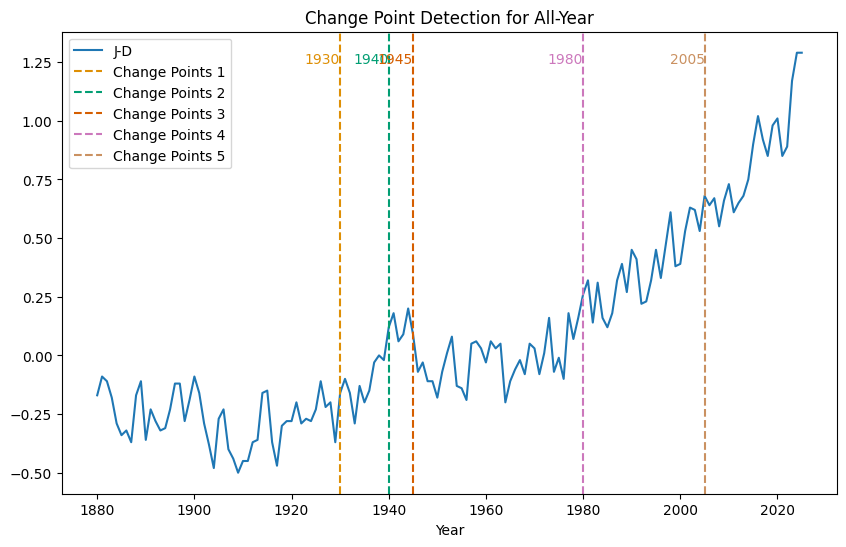

In [ ]:
import ruptures as rpt

points = df["J-D"].values
print(points)

# Search, binary segmentation
algo = rpt.Binseg(model="rank").fit(points)
result = algo.predict(n_bkps=5) # number of breakpoints to detect
print(result)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(df['Year'], points, label='J-D')
palette = sns.color_palette("colorblind")
# Addinv vertical lines for change points
for i, cp in enumerate(result[:-1]):
    year = df['Year'].iloc[cp]
    color = palette[i+1]
    plt.axvline(x=year, color=color, linestyle='--', label=f'Change Points {i+1}')
    plt.text(year, max(points), f'{year}', color=color, verticalalignment='top', horizontalalignment='right')
    print(f"Change Point {i+1}: Year {year}, Position {cp}")

plt.xlabel('Year')
plt.title('Change Point Detection for All-Year')
plt.legend()
plt.show()

Interpretation:

1. Titik Perubahan 1 (sekitar tahun 1930) Menandakan awal dari fase pemanasan awal yang dapat dikaitkan dengan efek jangka panjang dari Revolusi Industri tahap kedua.

2. Titik Perubahan 2 (sekitar tahun 1940) Munculnya pola pendinginan sesaat (cooling phase) yang konsisten dengan anomali suhu global pasca Perang Dunia II, kemungkinan akibat dari perubahan aktivitas industri dan emisi aerosol.

3. Titik Perubahan 3 (sekitar tahun 1950–1960) Pergeseran kembali menuju tren pemanasan, seiring dengan pertumbuhan industri pascaperang dan peningkatan emisi gas rumah kaca.

4. Titik Perubahan 4 (sekitar tahun 1980) Awal dari periode pemanasan yang sangat signifikan—ditandai sebagai permulaan era modern dari percepatan pemanasan global.

5. Titik Perubahan 5 (sekitar tahun 2000) Memperkuat bahwa dua dekade terakhir mengalami peningkatan suhu global yang tajam dan konsisten. Periode ini juga mencakup sebagian besar tahun terpanas dalam catatan sejarah modern.

Change Point Detection for Each Season

[-0.05 -0.17  0.07 -0.34 -0.11 -0.41 -0.35 -0.52 -0.34  0.01 -0.39 -0.37
 -0.15 -0.59 -0.38 -0.35 -0.17 -0.13 -0.19 -0.27 -0.24 -0.14 -0.18 -0.25
 -0.59 -0.43 -0.24 -0.37 -0.42 -0.57 -0.48 -0.63 -0.21 -0.44 -0.03 -0.1
 -0.17 -0.68 -0.51 -0.25 -0.32 -0.24 -0.33 -0.29 -0.17 -0.41  0.09 -0.25
 -0.15 -0.4  -0.37 -0.12 -0.03 -0.27 -0.23 -0.07 -0.27 -0.02  0.01 -0.08
  0.16  0.26  0.17  0.09  0.27  0.05  0.03 -0.15 -0.07 -0.1  -0.24 -0.33
  0.13  0.07 -0.1  -0.07 -0.22 -0.06  0.25  0.05  0.04  0.15  0.01  0.04
 -0.07 -0.18 -0.1  -0.1  -0.15 -0.14  0.18 -0.1  -0.16  0.26 -0.14  0.03
 -0.09  0.17  0.07  0.02  0.39  0.39  0.2   0.46  0.2   0.05  0.26  0.29
  0.49  0.24  0.41  0.44  0.4   0.31  0.16  0.57  0.32  0.37  0.68  0.56
  0.41  0.39  0.7   0.59  0.68  0.62  0.66  0.84  0.39  0.57  0.75  0.49
  0.52  0.62  0.67  0.86  1.24  1.01  0.87  0.94  1.18  0.75  0.89  0.88
  1.36  1.3 ]
[5, 55, 100, 120, 135, 146]
Change Point 1: Year 1885, Position 5, Y-Position 1.36
Change Point 2: Year 1935, P

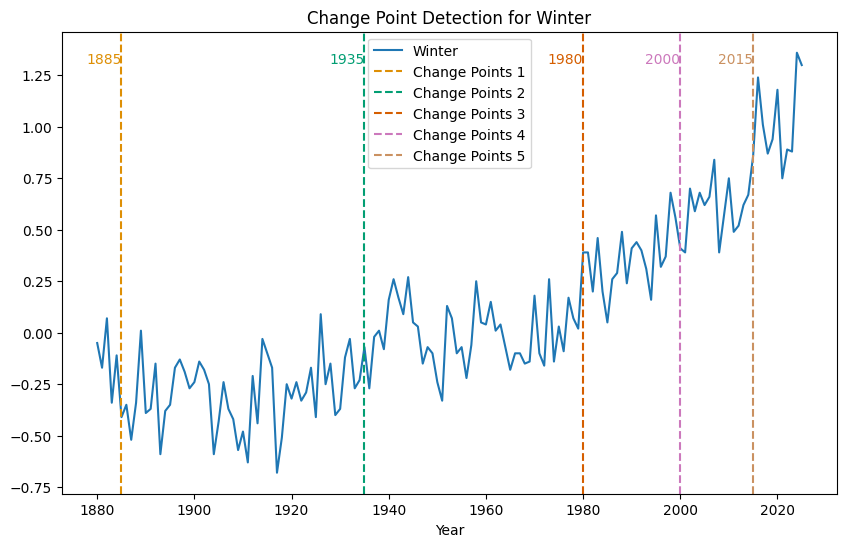

[-0.12  0.04 -0.09 -0.16 -0.37 -0.38 -0.32 -0.34 -0.28  0.05 -0.37 -0.21
 -0.32 -0.28 -0.33 -0.28 -0.25 -0.06 -0.38 -0.27 -0.07 -0.05 -0.3  -0.35
 -0.52 -0.29 -0.17 -0.38 -0.46 -0.57 -0.44 -0.56 -0.26 -0.43 -0.26 -0.04
 -0.32 -0.58 -0.38 -0.21 -0.22 -0.29 -0.24 -0.37 -0.2  -0.28 -0.09 -0.32
 -0.28 -0.38 -0.2  -0.18 -0.14 -0.28 -0.23 -0.27 -0.19 -0.14  0.02 -0.11
  0.12  0.14  0.08  0.04  0.21  0.1   0.    0.03 -0.12 -0.08 -0.13 -0.12
 -0.03  0.14 -0.16 -0.25 -0.26  0.01  0.05  0.13 -0.19  0.11  0.03 -0.09
 -0.26 -0.15 -0.07  0.04  0.    0.12  0.03 -0.1   0.    0.26 -0.07  0.11
 -0.16  0.28  0.15  0.13  0.31  0.35  0.12  0.34  0.22  0.15  0.24  0.23
  0.46  0.28  0.61  0.4   0.36  0.31  0.33  0.4   0.31  0.4   0.65  0.3
  0.49  0.55  0.7   0.59  0.54  0.68  0.53  0.72  0.6   0.6   0.84  0.61
  0.69  0.6   0.82  0.84  1.14  1.01  0.86  1.02  1.1   0.82  0.91  1.06
  1.29  1.29]
[5, 55, 95, 100, 120, 146]
Change Point 1: Year 1885, Position 5, Y-Position 1.29
Change Point 2: Year 1935, Po

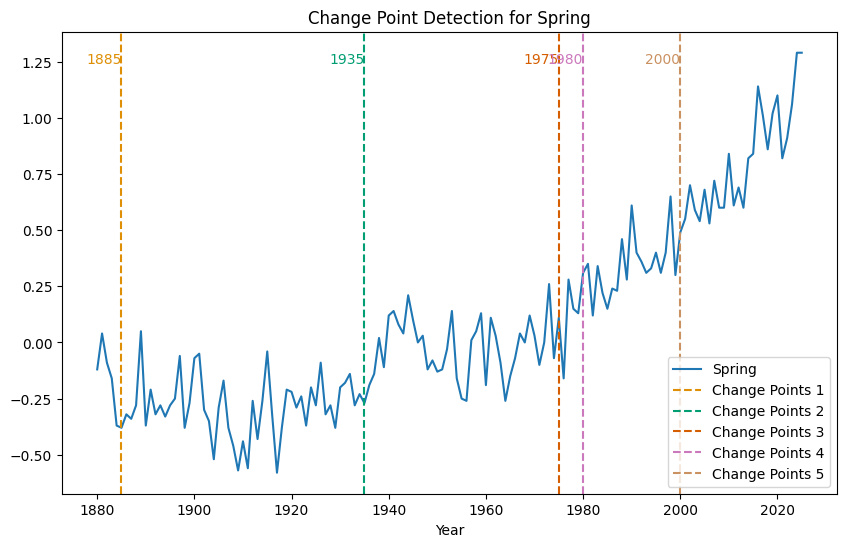

[-0.17 -0.08 -0.16 -0.1  -0.31 -0.36 -0.28 -0.29 -0.14 -0.13 -0.31 -0.19
 -0.27 -0.21 -0.29 -0.19 -0.07 -0.08 -0.24 -0.19 -0.11 -0.16 -0.3  -0.42
 -0.5  -0.26 -0.21 -0.38 -0.4  -0.44 -0.37 -0.46 -0.41 -0.39 -0.23 -0.2
 -0.39 -0.31 -0.34 -0.33 -0.31 -0.23 -0.31 -0.32 -0.31 -0.27 -0.23 -0.24
 -0.27 -0.38 -0.2  -0.05 -0.25 -0.26 -0.13 -0.23 -0.15 -0.02 -0.11 -0.06
  0.1   0.16  0.    0.01  0.17  0.1  -0.18 -0.04 -0.09 -0.18 -0.1  -0.01
  0.02  0.06 -0.18 -0.07 -0.17  0.11 -0.03  0.02 -0.02  0.04  0.01  0.11
 -0.1  -0.09  0.   -0.01 -0.1   0.01 -0.04 -0.08  0.07  0.12  0.01 -0.06
 -0.11  0.22 -0.04  0.11  0.2   0.32  0.08  0.26  0.14  0.12  0.13  0.33
  0.37  0.28  0.39  0.47  0.14  0.2   0.32  0.45  0.37  0.43  0.69  0.35
  0.4   0.53  0.56  0.57  0.38  0.62  0.64  0.6   0.52  0.69  0.66  0.69
  0.63  0.67  0.7   0.78  0.89  0.8   0.8   0.93  0.89  0.86  0.94  1.16
  1.25  1.25]
[20, 50, 60, 100, 125, 146]
Change Point 1: Year 1900, Position 20, Y-Position 1.25
Change Point 2: Year 1930, 

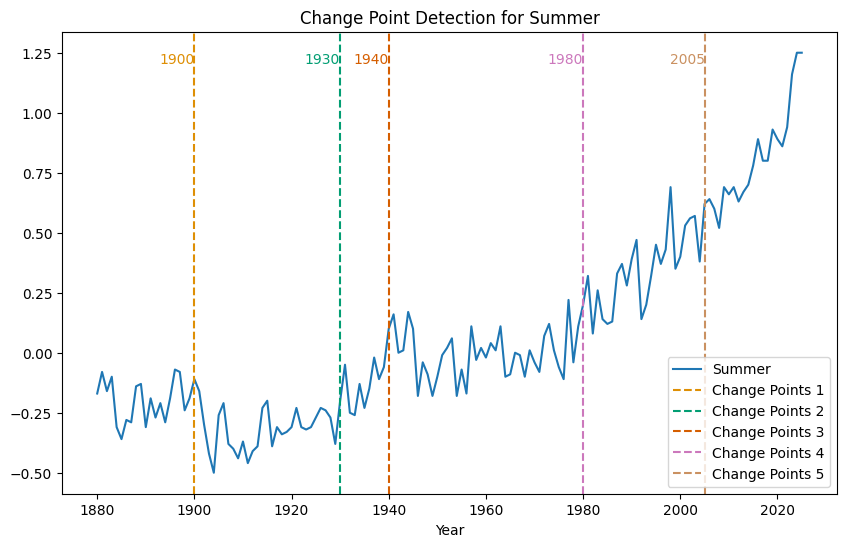

[-0.2  -0.19 -0.19 -0.2  -0.29 -0.25 -0.27 -0.29 -0.03 -0.28 -0.35 -0.23
 -0.24 -0.2  -0.26 -0.14 -0.03 -0.14 -0.32  0.   -0.02 -0.23 -0.32 -0.47
 -0.38 -0.18 -0.29 -0.35 -0.45 -0.38 -0.46 -0.3  -0.52 -0.3  -0.13 -0.2
 -0.39 -0.34 -0.12 -0.3  -0.26 -0.13 -0.28 -0.16 -0.3  -0.11 -0.11 -0.07
 -0.17 -0.18 -0.04 -0.03 -0.16 -0.28 -0.06 -0.18 -0.04  0.08  0.07 -0.02
  0.14  0.2   0.02  0.16  0.22  0.15 -0.07 -0.01 -0.11 -0.1  -0.22  0.04
 -0.02  0.03 -0.01 -0.14 -0.19  0.06  0.01 -0.07  0.    0.04  0.02  0.16
 -0.27 -0.09 -0.07 -0.01 -0.05  0.1   0.06 -0.06  0.04  0.08 -0.07 -0.1
 -0.12  0.07  0.08  0.26  0.21  0.16  0.15  0.28  0.14  0.1   0.09  0.32
  0.29  0.28  0.38  0.34  0.03  0.13  0.39  0.41  0.3   0.59  0.42  0.37
  0.32  0.58  0.59  0.63  0.61  0.74  0.7   0.59  0.66  0.72  0.72  0.6
  0.77  0.77  0.79  0.99  0.9   0.84  0.89  0.97  0.98  0.94  0.86  1.41
  1.29  1.29]
[45, 50, 55, 100, 120, 146]
Change Point 1: Year 1925, Position 45, Y-Position 1.41
Change Point 2: Year 1930, Po

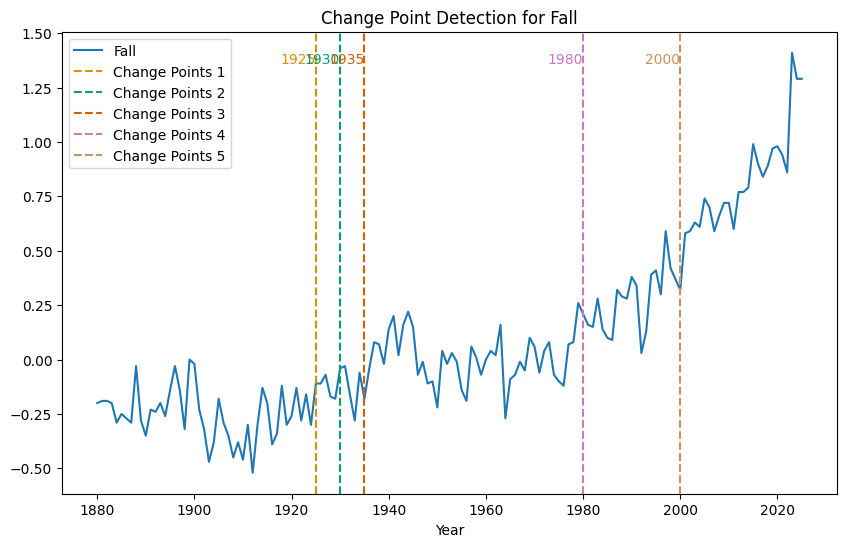

In [ ]:
import ruptures as rpt

season_names = {'DJF': 'Winter', 'MAM': 'Spring', 'JJA': 'Summer', 'SON': 'Fall'}
for abb, season in season_names.items():
    points = df[abb].values
    print(points)

    # Search, binary segmentation
    algo = rpt.Binseg(model="rank").fit(points)
    result = algo.predict(n_bkps=5) # number of breakpoints to detect
    print(result)

    # Plotting
    plt.figure(figsize=(10,6))
    plt.plot(df['Year'], points, label=f'{season}')
    palette = sns.color_palette("colorblind")

    # Addinv vertical lines for change points
    for i, cp in enumerate(result[:-1]):
        year = df['Year'].iloc[cp]
        color = palette[i+1]
        plt.axvline(x=year, color=color, linestyle='--', label=f'Change Points {i+1}')
        y_pos = max(points)
        plt.text(year, y_pos, f'{year}', color=color, verticalalignment='top', horizontalalignment='right')
        print(f"Change Point {i+1}: Year {year}, Position {cp}, Y-Position {y_pos}")

    plt.xlabel('Year')
    plt.title(f'Change Point Detection for {season}')
    plt.legend()
    plt.show()

Change Point Detection adalah teknik statistik yang digunakan untuk mengidentifikasi titik-titik waktu di mana terjadi perubahan signifikan dalam struktur data deret waktu. Dalam konteks ini, analisis dilakukan untuk masing-masing musim (Winter – DJF, Spring – MAM, Summer – JJA, dan Fall – SON) guna mendeteksi momen-momen penting yang mungkin menandai pergeseran tren suhu global musiman selama periode 1880–2023.

Berdasarkan hasil visualisasi dan deteksi menggunakan metode Binary Segmentation dari pustaka ruptures, lima titik perubahan (change points) berhasil diidentifikasi pada setiap musim. Titik-titik ini menunjukkan periode di mana pola anomali suhu mengalami transisi signifikan. Misalnya:

Winter (DJF): Titik perubahan muncul pada tahun 1885, 1935, 1945, 1980, dan 2015. Ini mencerminkan dinamika jangka panjang yang mungkin terkait dengan revolusi industri awal, dampak Perang Dunia II, dan percepatan pemanasan global di akhir abad ke-20 hingga awal abad ke-21.

Spring (MAM): Deteksi menunjukkan perubahan besar sekitar tahun 1885, 1935, 1975, 1980, dan 2000, menunjukkan pergeseran pola musim semi yang konsisten dengan tren global.

Summer (JJA): Titik-titik pada tahun 1900, 1930, 1940, 1980, dan 2005 mengindikasikan bahwa musim panas menjadi salah satu musim dengan perubahan suhu paling konsisten terhadap aktivitas antropogenik.

Fall (SON): Tahun 1925, 1935, 1945, 1980, dan 2000 menunjukkan perubahan signifikan yang tampaknya sejajar dengan peristiwa besar dunia dan dinamika iklim global.

Secara keseluruhan, pola titik perubahan yang terdeteksi di keempat musim memperkuat bukti adanya tren pemanasan global yang terjadi secara bertahap namun konsisten. Konsistensi tahun-tahun penting, seperti 1980 dan 2000, di seluruh musim, mencerminkan periode kritis dalam sejarah perubahan iklim yang perlu diperhatikan secara serius dalam perumusan kebijakan lingkungan dan mitigasi perubahan iklim.

# Forecasting

ARIMA (AutoRegressive Integrated Moving Average)

**Prepare data for ARIMA**

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

# Convert 'Year' to datetime format & set it as the Index to prepare the data
df['Year'] = pd.to_datetime(df['Year'], format='%Y')
df.set_index('Year', inplace=True)

ts = df['J-D']
ts

,J-D
Year,
1880-01-01,-0.17
1881-01-01,-0.09
1882-01-01,-0.11
1883-01-01,-0.18
1884-01-01,-0.29
...,...
2021-01-01,0.85
2022-01-01,0.89
2023-01-01,1.17


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 146 entries, 1880-01-01 to 2025-01-01
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Jan     146 non-null    float64
 1   Feb     146 non-null    float64
 2   Mar     146 non-null    float64
 3   Apr     146 non-null    float64
 4   May     146 non-null    float64
 5   Jun     146 non-null    float64
 6   Jul     146 non-null    float64
 7   Aug     146 non-null    float64
 8   Sep     146 non-null    float64
 9   Oct     146 non-null    float64
 10  Nov     146 non-null    float64
 11  Dec     146 non-null    float64
 12  J-D     146 non-null    float64
 13  D-N     146 non-null    float64
 14  DJF     146 non-null    float64
 15  MAM     146 non-null    float64
 16  JJA     146 non-null    float64
 17  SON     146 non-null    float64
dtypes: float64(18)
memory usage: 21.7 KB


In [ ]:
# Tentukan ukuran data
test_size = 3

# Split data
train = ts[:-test_size]  # 1880–2022
test = ts[-test_size:]   # 2023–2025

# Tampilkan hasil
print("Train:", train.index[0].year, "→", train.index[-1].year)
print("Test:", test.index[0].year, "→", test.index[-1].year)

Train: 1880 → 2022
Test: 2023 → 2025


Untuk memastikan evaluasi model yang kuat dan menghindari overfitting, dataset dibagi menjadi dua bagian:
1. Training Set (1880–2022): Digunakan untuk membangun dan melatih model ARIMA agar mampu mengenali pola historis dan tren jangka panjang.
2. Test Set (2023–2025): Digunakan untuk menguji kinerja prediksi model terhadap data baru yang belum pernah dilihat sebelumnya.

**Check for Stationarity**

ADF (Augmented Dickey-Fuller) Test

In [ ]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(train)  # Gantilah ts → train
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])


ADF Statistic: 1.035184
p-value: 0.994624


Interpretasi:

Nilai p-value sebesar 0.9946 sangat jauh di atas ambang batas signifikansi umum (α = 0.05), sehingga kita gagal menolak hipotesis nol (H₀) yang menyatakan bahwa data mengandung unit root (tidak stasioner). Dengan kata lain, data pelatihan menunjukkan pola non-stasioner, yang berarti mean dan variansnya tidak konstan sepanjang waktu.

**ACF dan PACF Plot**

Plot ACF (Autocorrelation Function) menunjukkan tingkat korelasi antara nilai data dengan nilai-nilai sebelumnya (lag). Ini digunakan untuk membantu mengidentifikasi komponen Moving Average (MA), atau parameter q dalam model ARIMA. Jika ACF memiliki lonjakan besar di lag 1 dan penurunan cepat setelahnya, itu mengindikasikan kemungkinan model MA.(p) component.

Plot PACF (Partial Autocorrelation Function) menunjukkan korelasi parsial antara suatu titik data dengan nilai-nilai sebelumnya setelah menghilangkan pengaruh lag perantara. Ini membantu menentukan komponen Autoregressive (AR), atau parameter p dalam model ARIMA. Lonjakan signifikan pada lag tertentu (misalnya lag 1 atau 2) dapat menjadi petunjuk nilai p.

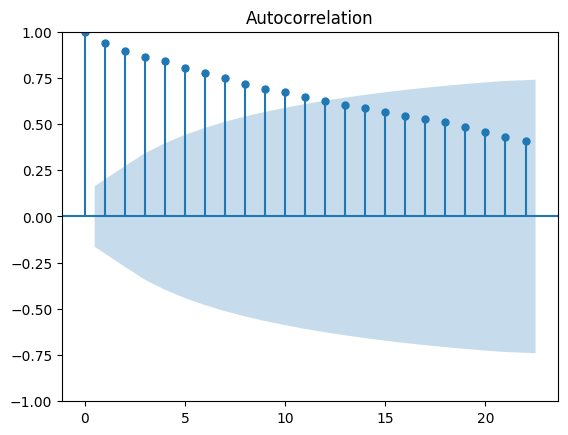

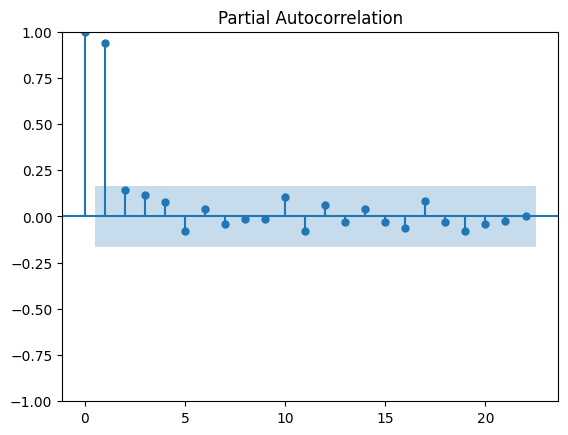

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(train)
plot_pacf(train)
plt.show()

Berdasarkan plot ACF dan PACF:

ACF menurun perlahan → menunjukkan data non-stasioner, memerlukan differencing (d=1).

PACF signifikan hanya di lag-1 → menunjukkan adanya pola autoregressive order 1 (p=1).

Tidak ada pola jelas pada ACF setelah differencing → komponen MA (q) kemungkinan kecil atau q=0.

ADF Statistic: -7.594050
p-value: 0.000000


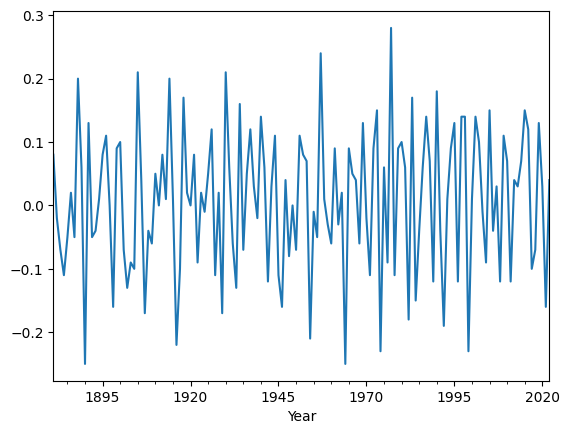

In [ ]:
ts_diff = train.diff().dropna()
ts_diff.plot()
result_diff = adfuller(ts_diff)
print('ADF Statistic: %f' % result_diff[0])
print('p-value: %f' % result_diff[1])

Nilai p-value < 0.05 dari uji ADF setelah differencing menunjukkan bahwa data telah menjadi stasioner. Oleh karena itu, parameter differencing (d) untuk model ARIMA dapat ditetapkan sebesar 1.

**Determind parameters p, q**

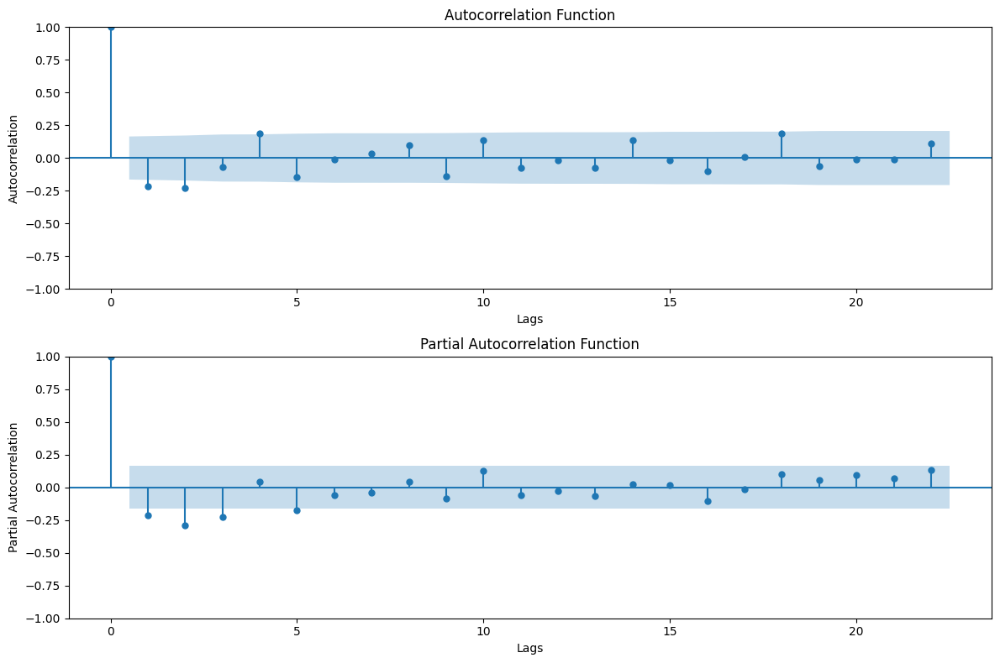

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, axes = plt.subplots(2,1,figsize=(12,8))
# Autocorrelation funciton
plot_acf(ts_diff, ax=axes[0])
axes[0].set_title('Autocorrelation Function')
axes[0].set_xlabel('Lags')
axes[0].set_ylabel('Autocorrelation')
# Partial autocorrelation function
plot_pacf(ts_diff, ax=axes[1])
axes[1].set_title('Partial Autocorrelation Function')
axes[1].set_xlabel('Lags')
axes[1].set_ylabel('Partial Autocorrelation')

plt.tight_layout()
plt.show()

A large spike at lag 0 in both the Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) plots, followed by non-significant spikes for subsequent lags, suggests that the series may not need additional AR (p) or MA (q) terms beyond the differencing that has been applied.

**Fit the ARIMA Model**

In [ ]:
model = ARIMA(ts_diff, order=(0,1,0))
model_fit = model.fit()

print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                    J-D   No. Observations:                  142
Model:                 ARIMA(0, 1, 0)   Log Likelihood                  46.521
Date:                Sat, 10 May 2025   AIC                            -91.043
Time:                        05:51:29   BIC                            -88.094
Sample:                    01-01-1881   HQIC                           -89.845
                         - 01-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0303      0.004      7.091      0.000       0.022       0.039
Ljung-Box (L1) (Q):                  34.84   Jarque-Bera (JB):                 2.33
Prob(Q):                              0.00   Pr

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency YS-JAN will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency YS-JAN will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency YS-JAN will be used.



# Forecasting

Time-Series Predictions

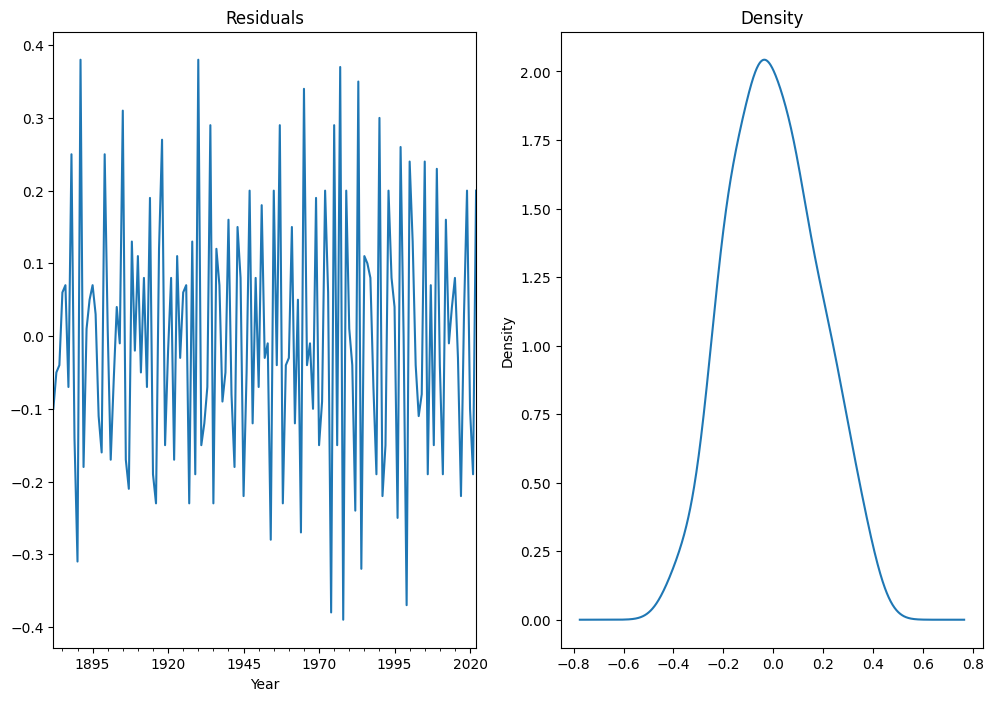

In [ ]:
# Residual and Density Plots
resids = model_fit.resid[1:]

fig, ax = plt.subplots(1,2,figsize=(12,8))
resids.plot(title='Residuals', ax=ax[0])
resids.plot(title='Density', kind='kde', ax=ax[1])

plt.show()

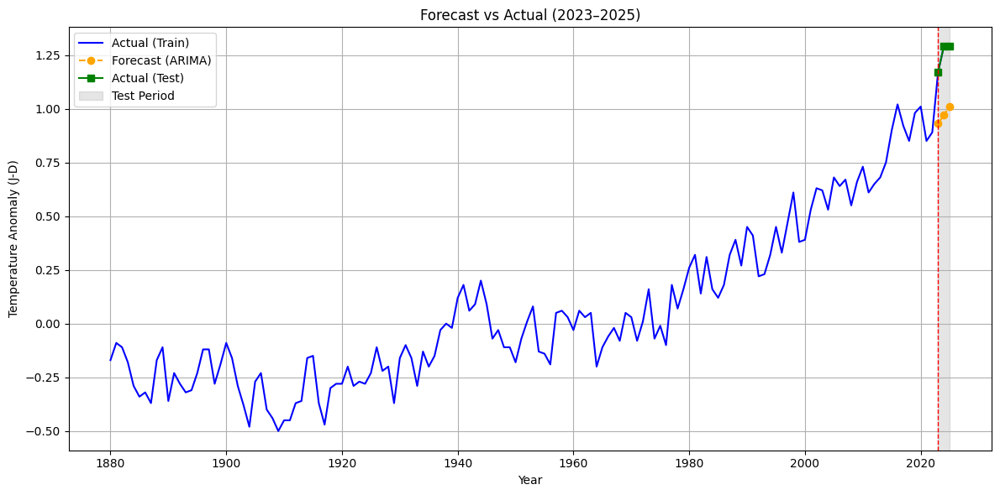

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# ===== Forecast berdasarkan ARIMA yang sudah dilatih =====
# Forecast untuk 3 tahun ke depan (2023–2025)
forecast_diff = model_fit.forecast(steps=3)
last_value = train.iloc[-1]  # Koreksi di sini!
forecast = forecast_diff.cumsum() + last_value

# Buat index tahun 2023–2025
future_years = pd.date_range(start='2023-01-01', periods=3, freq='YS')
forecast_df = pd.DataFrame({'Year': future_years, 'Forecast': forecast}).set_index('Year')

# ===== Plot =====
plt.figure(figsize=(12, 6))

# 1. Plot data historis (training)
plt.plot(ts.index, ts.values, label='Actual (Train)', color='blue')

# 2. Plot forecast ARIMA (2023–2025)
plt.plot(forecast_df.index, forecast_df['Forecast'], label='Forecast (ARIMA)', color='orange', linestyle='--', marker='o')

# 3. Plot actual test data
plt.plot(test.index, test.values, label='Actual (Test)', color='green', linestyle='-', marker='s')

# 4. Highlight test period
plt.axvspan(test.index[0], test.index[-1], color='gray', alpha=0.2, label='Test Period')

# 5. Garis pembatas
plt.axvline(x=test.index[0], color='red', linestyle='--', linewidth=1)

# ===== Format tambahan =====
plt.title('Forecast vs Actual (2023–2025)')
plt.xlabel('Year')
plt.ylabel('Temperature Anomaly (J-D)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error

mae = mean_absolute_error(test, forecast_df)
mape = mean_absolute_percentage_error(test, forecast_df)
rmse = np.sqrt(mean_squared_error(test, forecast_df))

print(f'mae - manual: {mae}')
print(f'mape - manual: {mape}')
print(f'rmse - manual: {rmse}')

mae - manual: 0.27999999999999986
mape - manual: 0.22341482806599075
rmse - manual: 0.28189832682487953


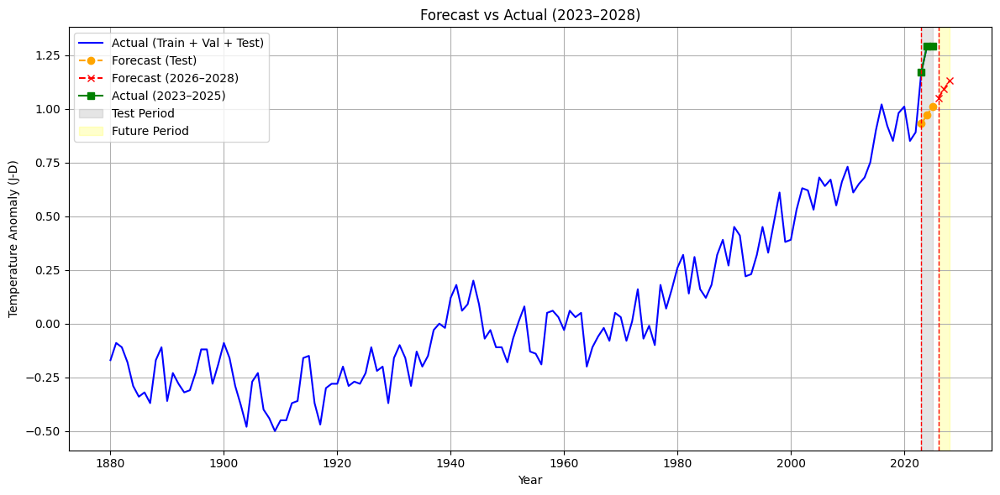

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Forecast 6 langkah (2023–2028)
forecast_diff = model_fit.forecast(steps=6)

# Gunakan nilai terakhir dari TRAINING SET (bukan seluruh ts)
last_value = train.iloc[-1]
forecast_values = forecast_diff.cumsum() + last_value

# Buat index tahun prediksi (2023–2028)
future_years = pd.date_range(start='2023-01-01', periods=6, freq='YS')

# DataFrame hasil prediksi
forecast_df2 = pd.DataFrame({
    'Year': future_years,
    'Forecast': forecast_values
}).set_index('Year')

# Pisahkan hasil prediksi untuk:
forecast_test = forecast_df2.iloc[:3]   # 2023–2025
forecast_future = forecast_df2.iloc[3:] # 2026–2028

# ===== Plot =====
plt.figure(figsize=(12, 6))

# 1. Data historis (1880–2025)
plt.plot(ts.index, ts.values, label='Actual (Train + Val + Test)', color='blue')

# 2. Forecast untuk test (2023–2025)
plt.plot(forecast_test.index, forecast_test['Forecast'], label='Forecast (Test)', color='orange', linestyle='--', marker='o')

# 3. Forecast ke depan (2026–2028)
plt.plot(forecast_future.index, forecast_future['Forecast'], label='Forecast (2026–2028)', color='red', linestyle='--', marker='x')

# 4. Data test aktual
plt.plot(test.index, test.values, label='Actual (2023–2025)', color='green', linestyle='-', marker='s')

# 5. Highlight test & future period
plt.axvspan(test.index[0], test.index[-1], color='gray', alpha=0.2, label='Test Period')
plt.axvspan(forecast_future.index[0], forecast_future.index[-1], color='yellow', alpha=0.2, label='Future Period')

# 6. Garis pembatas test/future
plt.axvline(x=test.index[0], color='red', linestyle='--', linewidth=1)
plt.axvline(x=forecast_future.index[0], color='red', linestyle='--', linewidth=1)

# ===== Format tambahan =====
plt.title('Forecast vs Actual (2023–2028)')
plt.xlabel('Year')
plt.ylabel('Temperature Anomaly (J-D)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Auto-ARIMA

In [ ]:
#pip install --upgrade numpy

In [ ]:
#!pip install --upgrade pmdarima

In [ ]:
from pmdarima import auto_arima

model_auto = auto_arima(train, start_p=1, start_q=1,
                   test='adf',       # Use adftest to find optimal 'd'
                   max_p=5, max_q=5, # Maximum p and q
                   m=1,              # Frequency of the series
                   d=None,           # Let the model determine 'd'
                   seasonal=False,   # No Seasonality
                   start_P=0,
                   D=0,
                   trace=True,
                   error_action='ignore',
                   suppress_warnings=True,
                   stepwise=True)

print(model_auto.summary())

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-236.285, Time=5.29 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-216.645, Time=0.21 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-221.381, Time=0.30 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-231.004, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-218.007, Time=0.10 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-236.898, Time=1.55 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-231.796, Time=0.54 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=-237.570, Time=4.82 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-237.038, Time=0.95 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=-236.593, Time=8.69 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-237.449, Time=3.42 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-234.890, Time=2.10 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=-235.333, Time=0.62 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=-236.049, Time=3.07 sec


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



 ARIMA(3,1,1)(0,0,0)[0]             : AIC=-237.425, Time=3.44 sec

Best model:  ARIMA(3,1,1)(0,0,0)[0] intercept
Total fit time: 36.030 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  143
Model:               SARIMAX(3, 1, 1)   Log Likelihood                 124.785
Date:                Sat, 10 May 2025   AIC                           -237.570
Time:                        05:52:11   BIC                           -219.835
Sample:                    01-01-1880   HQIC                          -230.364
                         - 01-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0223      0.016      1.433      0.152      -0.008

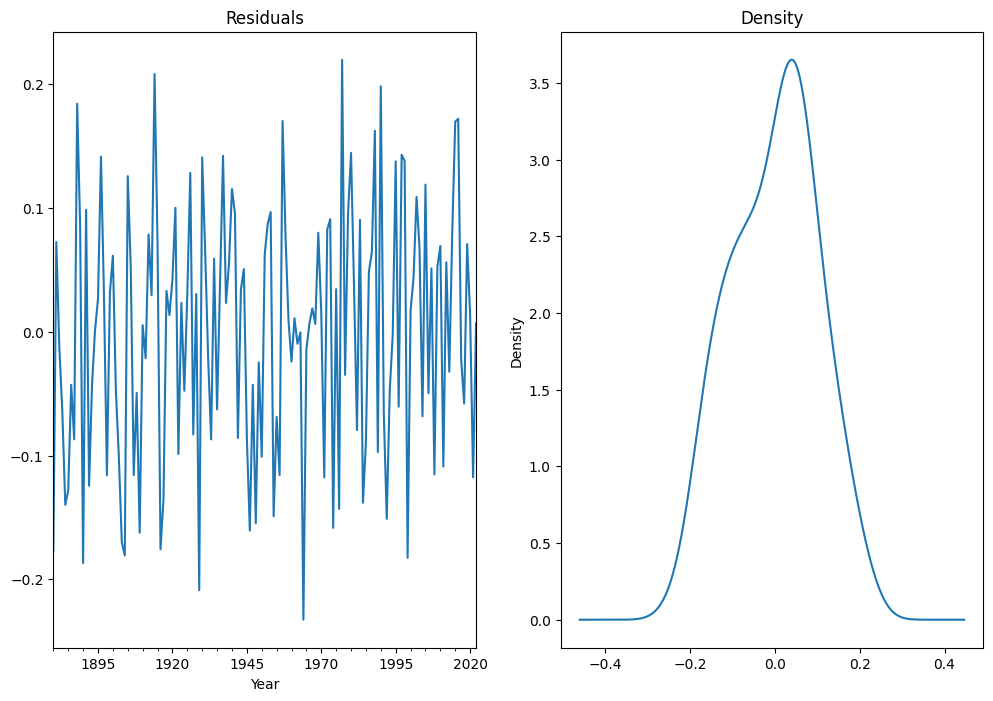

In [ ]:
# Residual and Density Plots
resids = pd.Series(model_auto.resid())

fig, ax = plt.subplots(1,2,figsize=(12,8))
resids.plot(title='Residuals', ax=ax[0])
resids.plot(title='Density', kind='kde', ax=ax[1])

plt.show()

Now we have two ARIMA models: ARIMA(0, 1, 0) and the auto-fitted ARIMA(3, 1, 1). Let’s compare and evaluate their predictions.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



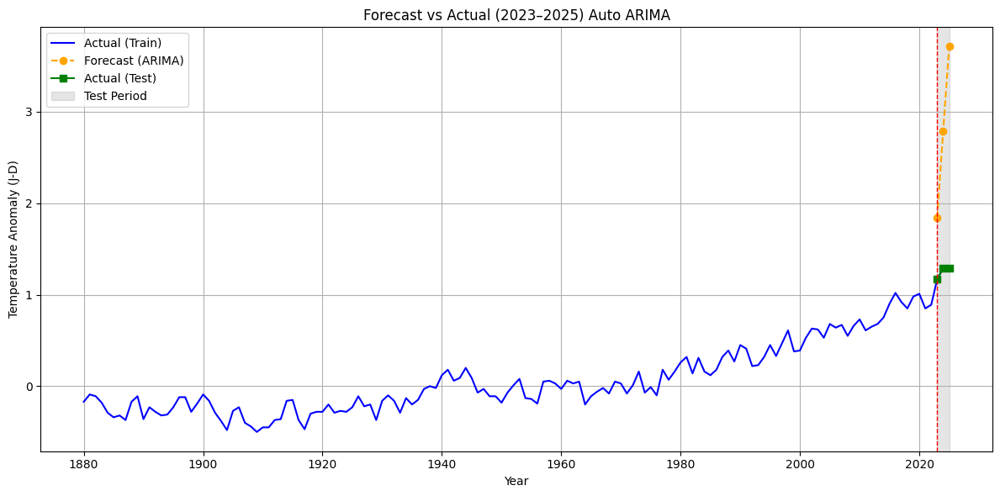

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from pmdarima import auto_arima
# ===== Forecast berdasarkan ARIMA yang sudah dilatih =====
# Forecast untuk 3 tahun ke depan (2023–2025)
forecast_diff = model_auto.predict(n_periods=3)
last_value = train.iloc[-1]  # Koreksi di sini!
forecast = forecast_diff.cumsum() + last_value

# Buat index tahun 2023–2025
future_years = pd.date_range(start='2023-01-01', periods=3, freq='YS')
forecast_df = pd.DataFrame({'Year': future_years, 'Forecast': forecast}).set_index('Year')

# ===== Plot =====
plt.figure(figsize=(12, 6))

# 1. Plot data historis (training)
plt.plot(ts.index, ts.values, label='Actual (Train)', color='blue')

# 2. Plot forecast ARIMA (2023–2025)
plt.plot(forecast_df.index, forecast_df['Forecast'], label='Forecast (ARIMA)', color='orange', linestyle='--', marker='o')

# 3. Plot actual test data
plt.plot(test.index, test.values, label='Actual (Test)', color='green', linestyle='-', marker='s')

# 4. Highlight test period
plt.axvspan(test.index[0], test.index[-1], color='gray', alpha=0.2, label='Test Period')

# 5. Garis pembatas
plt.axvline(x=test.index[0], color='red', linestyle='--', linewidth=1)

# ===== Format tambahan =====
plt.title('Forecast vs Actual (2023–2025) Auto ARIMA')
plt.xlabel('Year')
plt.ylabel('Temperature Anomaly (J-D)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
mae = mean_absolute_error(test, forecast_df)
mape = mean_absolute_percentage_error(test, forecast_df)
rmse = np.sqrt(mean_squared_error(test, forecast_df))

print(f'mae - auto: {mae}')
print(f'mape - auto: {mape}')
print(f'rmse - auto: {rmse}')

mae - auto: 1.5307678872271948
mape - auto: 1.2044071696679024
rmse - auto: 1.6899701823898066


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



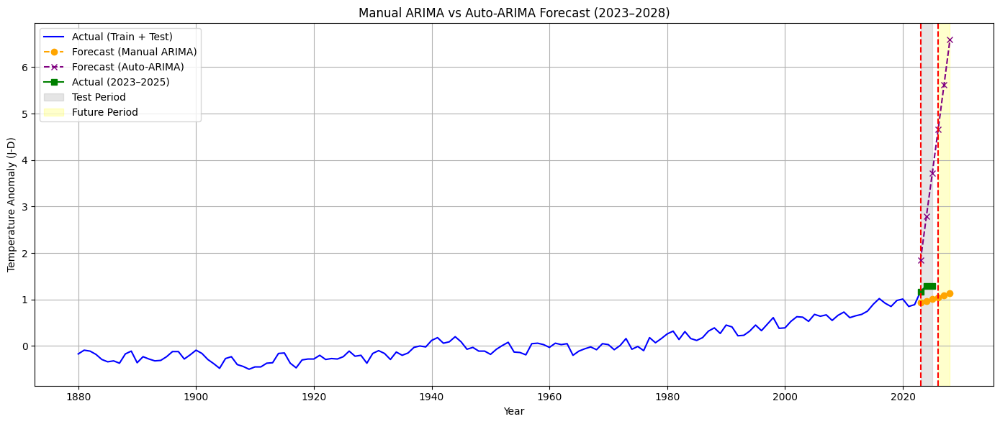

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# === Forecast dengan ARIMA manual ===
forecast_manual_diff = model_fit.forecast(steps=6)
last_value_manual = train.iloc[-1]
forecast_manual = forecast_manual_diff.cumsum() + last_value_manual

# === Forecast dengan auto-ARIMA ===
forecast_auto = model_auto.predict(n_periods=6)
last_value_auto = train.iloc[-1]
forecast_auto = pd.Series(forecast_auto).cumsum() + last_value_auto

# Buat index tahun prediksi (2023–2028)
future_years = pd.date_range(start='2023-01-01', periods=6, freq='YS')

# DataFrame hasil prediksi
forecast_df_manual = pd.DataFrame({
    'Year': future_years,
    'Forecast_Manual': forecast_manual
}).set_index('Year')

forecast_df_auto = pd.DataFrame({
    'Year': future_years,
    'Forecast_Auto': forecast_auto
}).set_index('Year')

# Gabungkan hasil forecast
forecast_df3 = pd.concat([forecast_df_manual, forecast_df_auto], axis=1)

# ===== Plot =====
plt.figure(figsize=(14, 6))

# 1. Data historis
plt.plot(ts.index, ts.values, label='Actual (Train + Test)', color='blue')

# 2. Forecast ARIMA manual (2023–2028)
plt.plot(forecast_df3.index, forecast_df3['Forecast_Manual'], label='Forecast (Manual ARIMA)', color='orange', linestyle='--', marker='o')

# 3. Forecast Auto-ARIMA (2023–2028)
plt.plot(forecast_df3.index, forecast_df3['Forecast_Auto'], label='Forecast (Auto-ARIMA)', color='purple', linestyle='--', marker='x')

# 4. Data test aktual
plt.plot(test.index, test.values, label='Actual (2023–2025)', color='green', linestyle='-', marker='s')

# 5. Highlight test & future period
plt.axvspan(test.index[0], test.index[-1], color='gray', alpha=0.2, label='Test Period')
plt.axvspan(forecast_df3.index[3], forecast_df3.index[-1], color='yellow', alpha=0.2, label='Future Period')

# 6. Garis pembatas
plt.axvline(x=test.index[0], color='red', linestyle='--')
plt.axvline(x=forecast_df3.index[3], color='red', linestyle='--')

# Format tambahan
plt.title('Manual ARIMA vs Auto-ARIMA Forecast (2023–2028)')
plt.xlabel('Year')
plt.ylabel('Temperature Anomaly (J-D)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


if we plot both models’ predictions together, you can see that the manually fitted model of ARIMA(0, 1, 0) is closer to the actual test set.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from matplotlib.collections import LineCollection
import matplotlib.dates as mdates

# Forecast 6 langkah (2023–2028)
forecast_diff = model_fit.forecast(steps=6)
last_value = train.iloc[-1]
forecast_values = forecast_diff.cumsum() + last_value

# Buat index tahun prediksi
future_years = pd.date_range(start='2023-01-01', periods=6, freq='YS')
forecast_df2 = pd.DataFrame({'Forecast': forecast_values}, index=future_years)

# Gabungkan data train dan prediksi (1880–2028)
combined = pd.concat([train, forecast_df2['Forecast']])
combined.index = pd.to_datetime(combined.index)  # Pastikan index datetime
combined = combined.dropna()  # Hindari masalah NaN

# Konversi datetime ke angka (float)
dates_dt = pd.to_datetime(combined.index)
x = mdates.date2num(dates_dt)
y = combined.values

# Siapkan segmen garis
points = np.array([x, y]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)

# Warna suhu (gradasi biru ke merah)
norm = plt.Normalize(vmin=-1, vmax=1)
cmap = plt.cm.bwr
colors = cmap(norm(y[:-1]))

# Siapkan plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_xlim(x[0], x[-1])
ax.set_ylim(y.min() - 0.1, y.max() + 0.1)
ax.set_title('Time-lapse Suhu Global: 1880–2028')
ax.set_xlabel('Year')
ax.set_ylabel('Temperature Anomaly (J-D)')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# LineCollection utama
line_collection = LineCollection([], linewidth=2)
ax.add_collection(line_collection)

# Shadow trail (semi transparan)
shadow_collection = LineCollection([], linewidth=4, alpha=0.3)
ax.add_collection(shadow_collection)

# Titik animasi
point, = ax.plot([], [], 'o', markersize=8)

# Inisialisasi animasi
def init():
    line_collection.set_segments([])
    shadow_collection.set_segments([])
    point.set_data([], [])
    return line_collection, shadow_collection, point

# Update animasi per frame
def update(frame):
    if frame == 0:
        return init()

    segs = segments[:frame]
    seg_colors = colors[:frame]

    line_collection.set_segments(segs)
    line_collection.set_color(seg_colors)

    # Shadow trail effect
    trail_len = 10
    start = max(0, frame - trail_len)
    shadow_collection.set_segments(segments[start:frame])
    shadow_collection.set_color(colors[start:frame])

    point.set_data([x[frame]], [y[frame]])
    point.set_color(cmap(norm(y[frame])))

    return line_collection, shadow_collection, point

# Buat animasi
anim = FuncAnimation(fig, update, frames=len(combined), init_func=init,
                     blit=True, interval=50)

plt.close()  # Supress extra figure
HTML(anim.to_jshtml())
